In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings("ignore")
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from pmdarima import auto_arima
from statsmodels.tsa.seasonal import seasonal_decompose 
from datetime import timedelta
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
import statsmodels.api as sm
import math

In [2]:
pip install pmdarima

  Using cached pmdarima-1.8.2-cp38-cp38-win_amd64.whl (596 kB)



In [2]:
data = pd.read_csv('pharma/salesdaily.csv',parse_dates=['datum'],index_col = 'datum')

In [3]:
data.head()

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
datum,,,,,,,,,,,,
2014-01-02,0.0,3.67,3.4,32.40,7.0,0.0,0.0,2.0,2014,1,248,Thursday
2014-01-03,8.0,4.00,4.4,50.60,16.0,0.0,20.0,4.0,2014,1,276,Friday
2014-01-04,2.0,1.00,6.5,61.85,10.0,0.0,9.0,1.0,2014,1,276,Saturday
2014-01-05,4.0,3.00,7.0,41.10,8.0,0.0,3.0,0.0,2014,1,276,Sunday
2014-01-06,5.0,1.00,4.5,21.70,16.0,2.0,6.0,2.0,2014,1,276,Monday


In [4]:
data.shape

(2106, 12)

In [4]:
data.tail()

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
datum,,,,,,,,,,,,
2019-10-04,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00,2019,10,276,Friday
2019-10-05,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33,2019,10,276,Saturday
2019-10-06,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20,2019,10,276,Sunday
2019-10-07,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00,2019,10,276,Monday
2019-10-08,0.33,1.730,0.50,44.30,20.0,2.0,2.0,0.00,2019,10,190,Tuesday


In [3]:
cols = ["M01AB","M01AE","N02BA","N02BE","N05B","N05C","R03","R06"]

In [5]:
def plot_graph(data,cols):
    fig = plt.figure(figsize=(20, 20))
    for loc, col in enumerate(cols):
        plt.subplot(3, 3, loc+1)
        plt.plot(data[col])
        plt.title(col)        

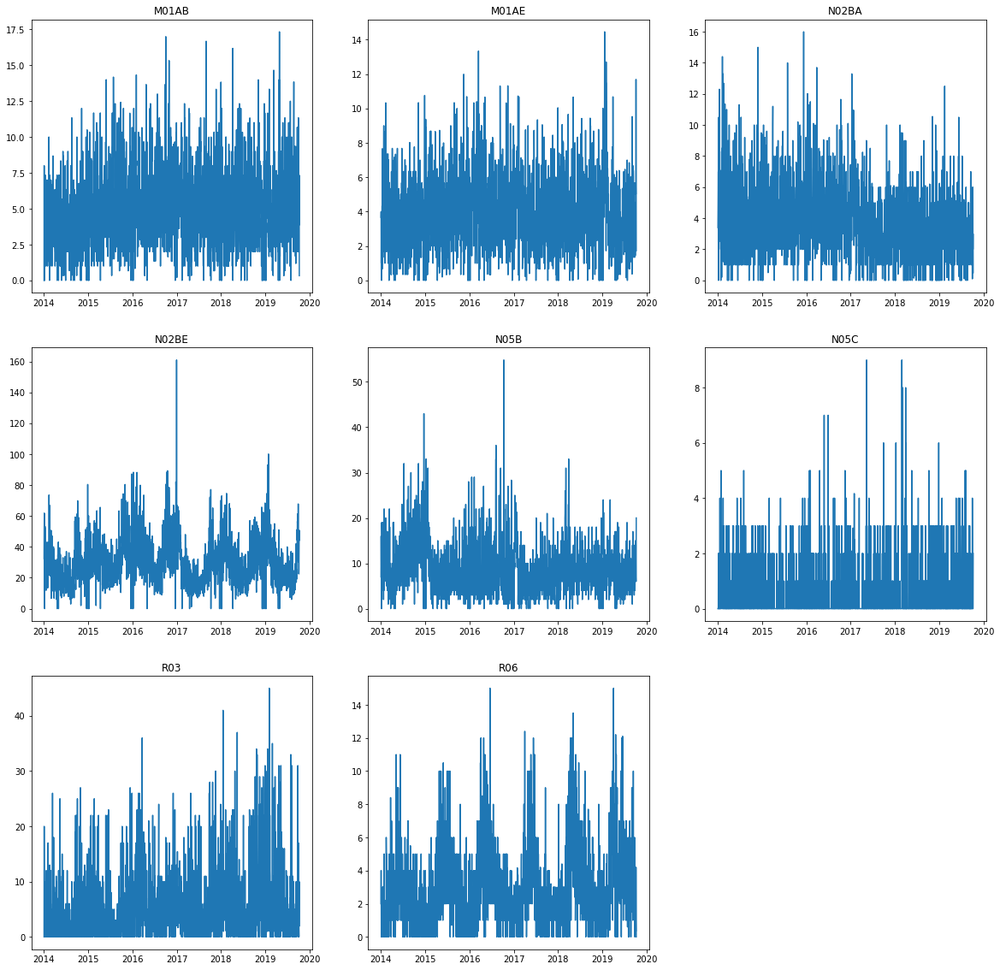

In [6]:
plot_graph(data,cols)

## ADF Test

In [82]:
for col in cols:
    print(col)
    X = data[col]
    result = adfuller(X)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Lags: %f' % result[2])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
    if(result[1] <= 0.05):
        print('\tReject Null Hypothesis : Stationary\n')
    else :
        print('\tAccept Null Hypothesis : Non-Stationary\n')
    

M01AB
ADF Statistic: -8.279357
p-value: 0.000000
Lags: 14.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.568
	Reject Null Hypothesis : Stationary

M01AE
ADF Statistic: -7.472604
p-value: 0.000000
Lags: 21.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.568
	Reject Null Hypothesis : Stationary

N02BA
ADF Statistic: -6.135330
p-value: 0.000000
Lags: 17.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.568
	Reject Null Hypothesis : Stationary

N02BE
ADF Statistic: -4.193657
p-value: 0.000675
Lags: 13.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.568
	Reject Null Hypothesis : Stationary

N05B
ADF Statistic: -4.779480
p-value: 0.000060
Lags: 26.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.568
	Reject Null Hypothesis : Stationary

N05C
ADF Statistic: -15.140289
p-value: 0.000000
Lags: 6.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.568
	Reject Null Hypothesis : Stationary

R03
ADF Statistic: -5.128090
p-value: 0.000012
Lags: 21.0000

## Hourly Sales

In [96]:
def hourly_analysis(data,cols):
    fig = plt.figure(figsize=(25, 20))
    for loc, col in enumerate(cols):
        plt.subplot(4, 2, loc+1)
        df = data.loc[:,[col,'Hour']].groupby('Hour').sum()
        sns.barplot(x=df.index,y=col,data=df)
        plt.title(col,fontsize=20)

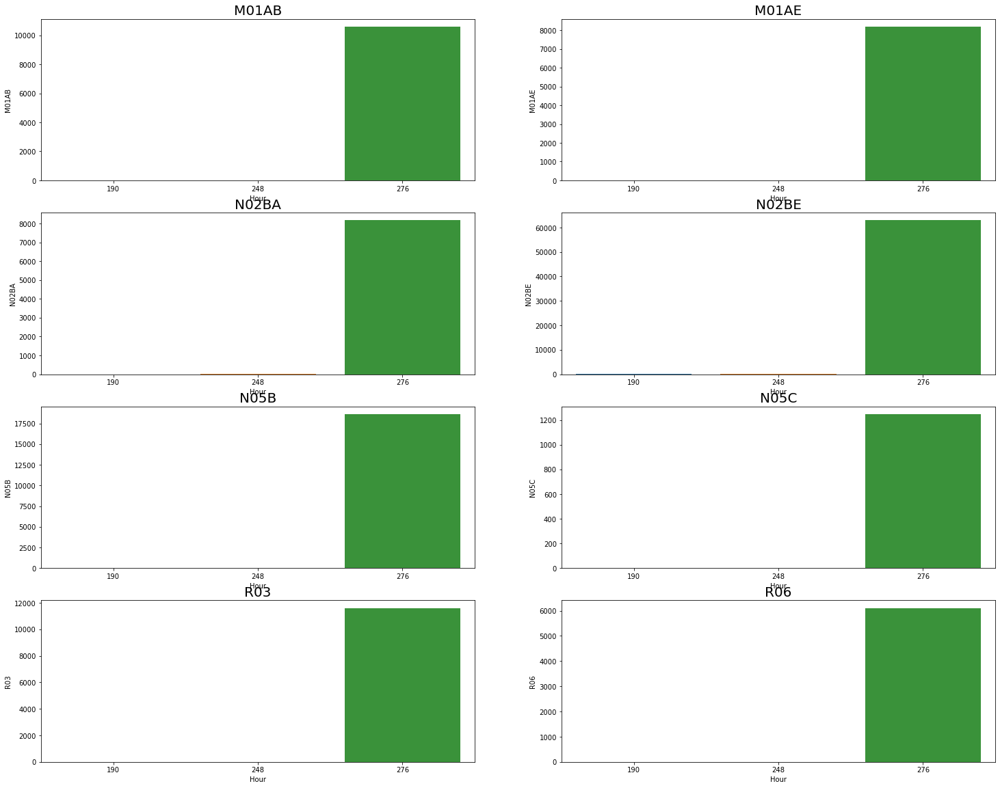

In [97]:
hourly_analysis(data,cols)

## Weekly Analysis

In [100]:
days = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

In [88]:
def weekly_analysis(data,cols):
    fig = plt.figure(figsize=(25, 20))
    for loc, col in enumerate(cols):
        plt.subplot(4, 2, loc+1)
        df = data.loc[:,[col,'Weekday Name']].groupby('Weekday Name').sum().reindex(days)
        sns.barplot(x=df.index,y=col,data=df)
        plt.title(col,fontsize=20,color="green")
        

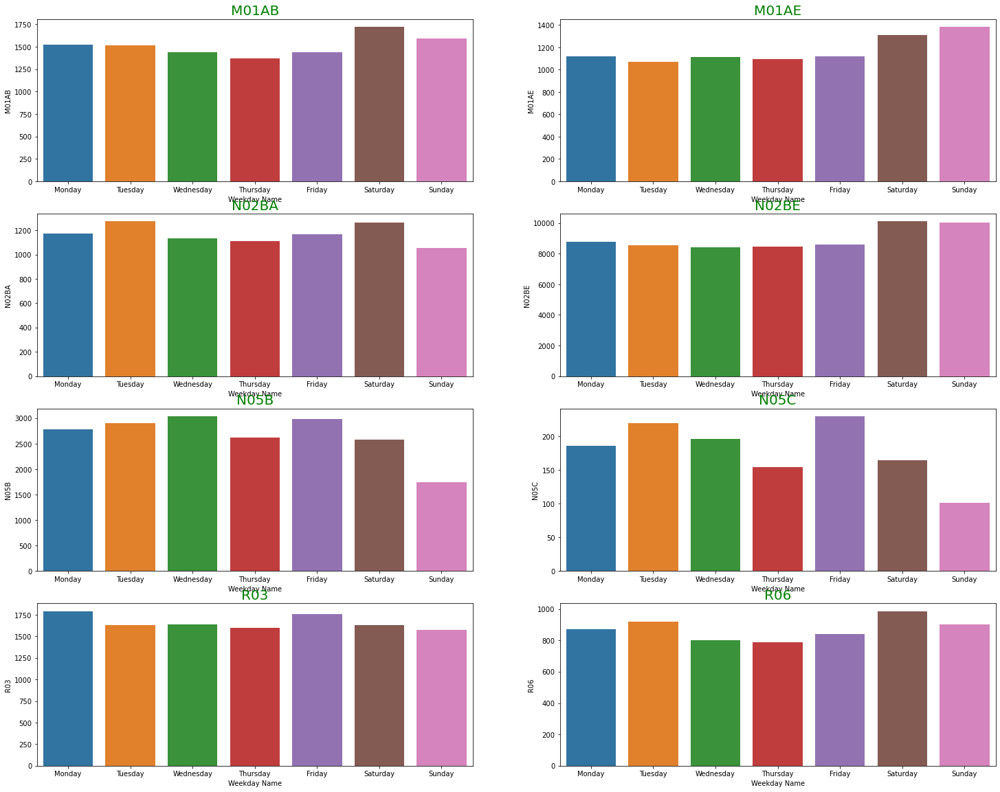

In [89]:
weekly_analysis(data,cols)

## Monthly Analysis

In [86]:
def monthly_analysis(data,cols):
    fig = plt.figure(figsize=(25, 20))
    for loc, col in enumerate(cols):
        plt.subplot(4, 2, loc+1)
        df = data.loc[:,[col,'Month']].groupby('Month').sum()
        sns.barplot(x=df.index,y=col,data=df)
        plt.title(col,fontsize=20,color="green")

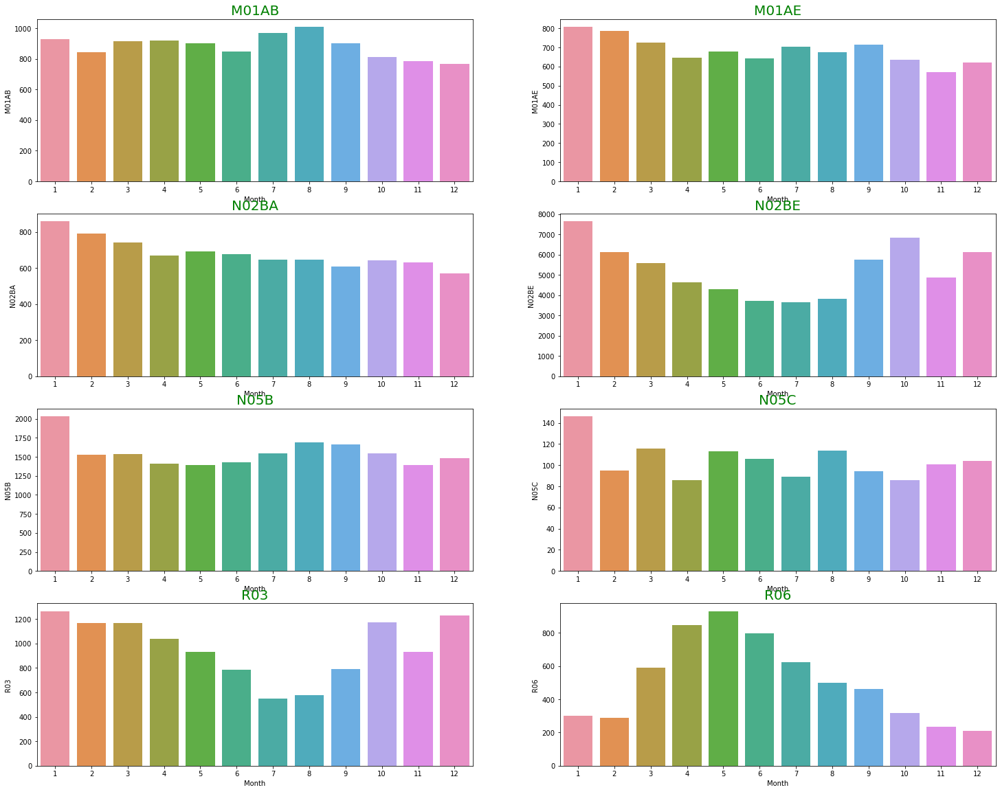

In [87]:
monthly_analysis(data,cols)

## Yearly Analysis

In [90]:
def yearly_analysis(data,cols):
    fig = plt.figure(figsize=(25, 20))
    for loc, col in enumerate(cols):
        plt.subplot(4, 2, loc+1)
        df = data.loc[:,[col,'Year']].groupby('Year').sum()
        sns.barplot(x=df.index,y=col,data=df)
        plt.title(col,fontsize=20,color="green")

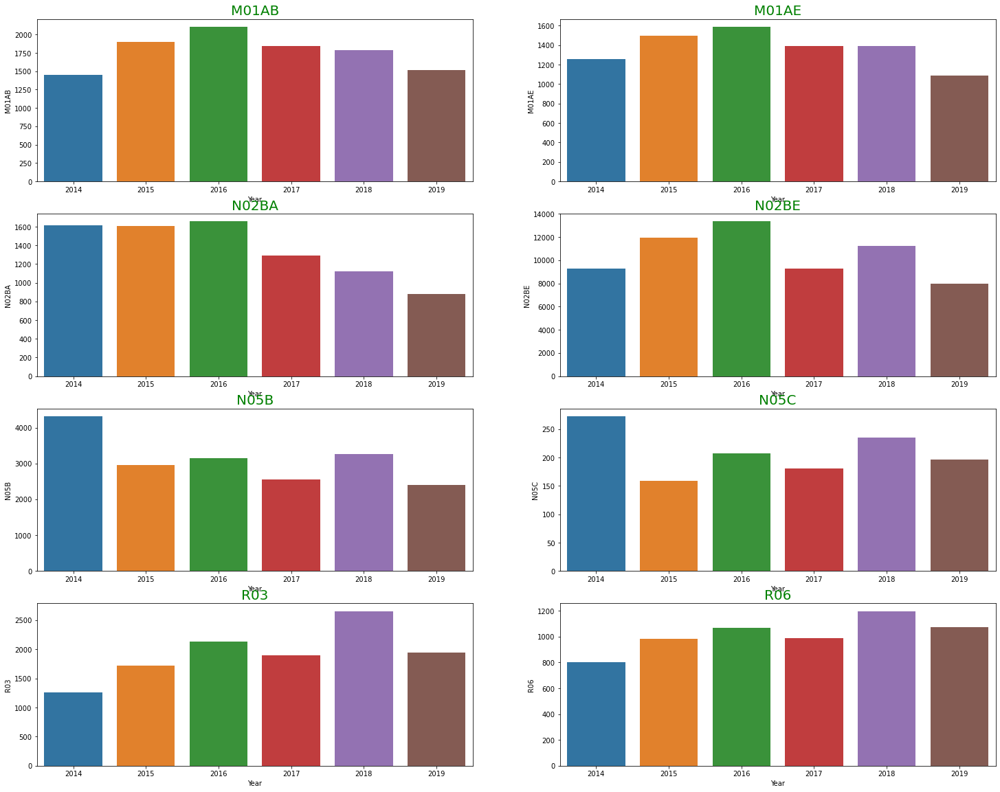

In [91]:
yearly_analysis(data,cols)

## Individual Analysis 

In [103]:
def analysis(data,cols):
    fig = plt.figure(figsize=(30,40))
    loc = 0
    for col in cols:
        loc = loc+1
        plt.subplot(8,4,loc)
        df = data.loc[:,[col,'Hour']].groupby('Hour').sum()
        sns.barplot(x=df.index,y=col,data=df)
        loc = loc+1
        plt.subplot(8,4,loc)
        df = data.loc[:,[col,'Weekday Name']].groupby('Weekday Name').sum().reindex(days)
        sns.barplot(x=df.index,y=col,data=df)
        loc = loc+1
        plt.subplot(8,4,loc)
        df = data.loc[:,[col,'Month']].groupby('Month').sum()
        sns.barplot(x=df.index,y=col,data=df)
        loc = loc+1
        plt.subplot(8,4,loc)
        df = data.loc[:,[col,'Year']].groupby('Year').sum()
        sns.barplot(x=df.index,y=col,data=df)
        
        

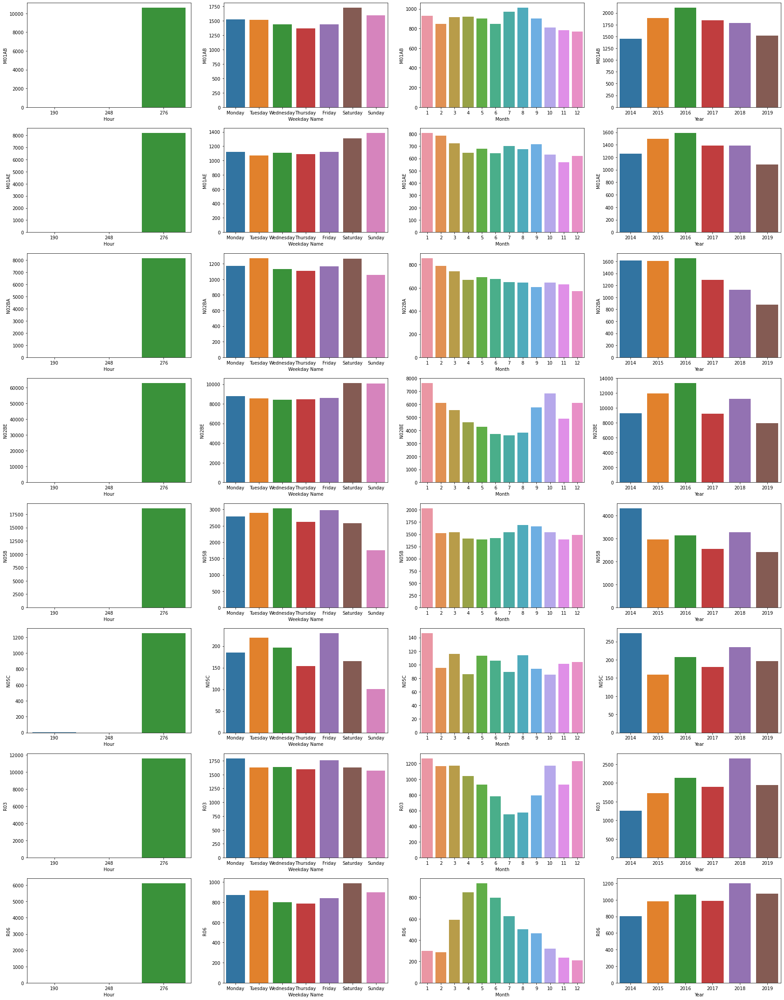

In [104]:
analysis(data,cols)

## Rolling Average

In [151]:
years = [2014,2015,2016,2017,2018,2019]

In [16]:
def rolling_avg_graph(data,col):
    fig = plt.figure(figsize=(20, 20))
    for loc,year in enumerate(years):
        plt.subplot(6, 1,loc+1)
        year_mask = data['Year'] == year
        mask_data = data[year_mask]
        arr_mean = mask_data[col].rolling(7).mean()
        arr_std = mask_data[col].rolling(7).std()
        sns.lineplot(x = mask_data.index,y = col,data = mask_data,label = 'HourlySales')
        sns.lineplot(x = mask_data.index,y = arr_mean,data = mask_data,label = 'RollingAvgSales')
        sns.lineplot(x = mask_data.index,y = arr_std,data = mask_data,label = 'RollingStdSales')
        plt.title(col,fontsize=20)

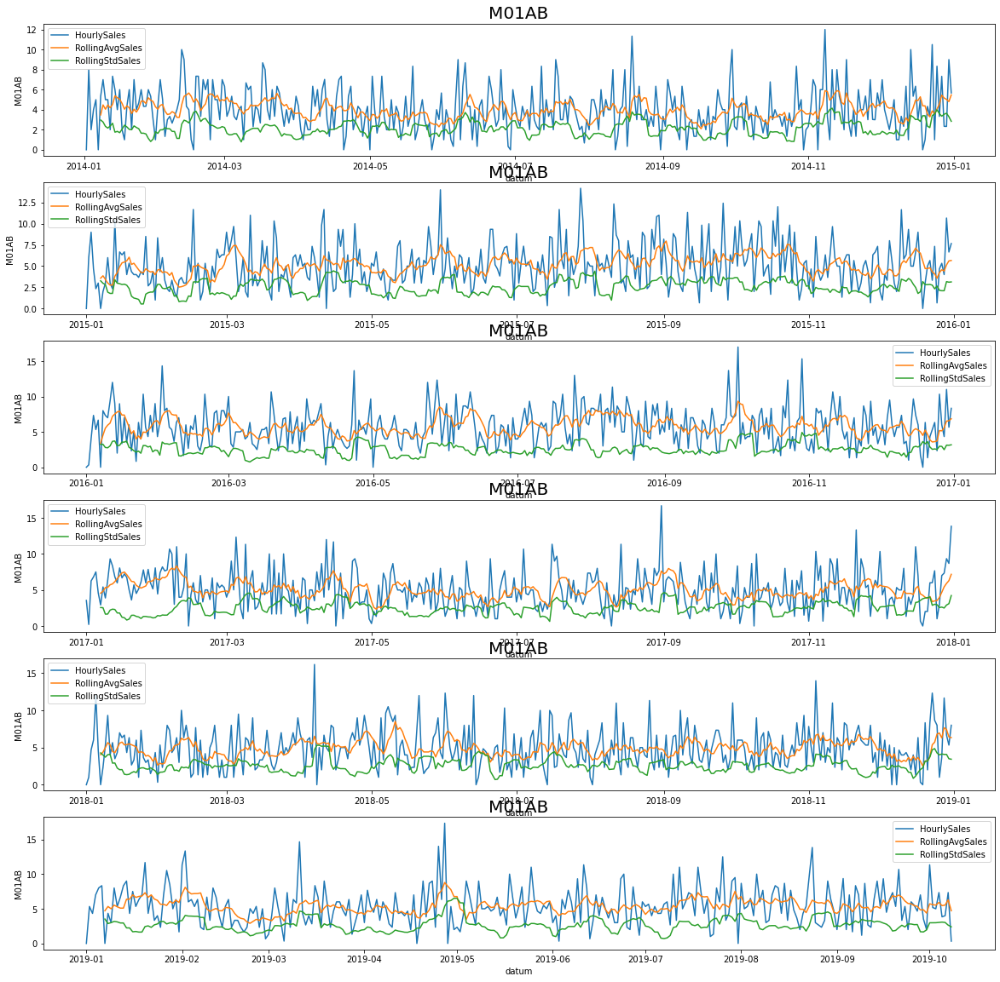

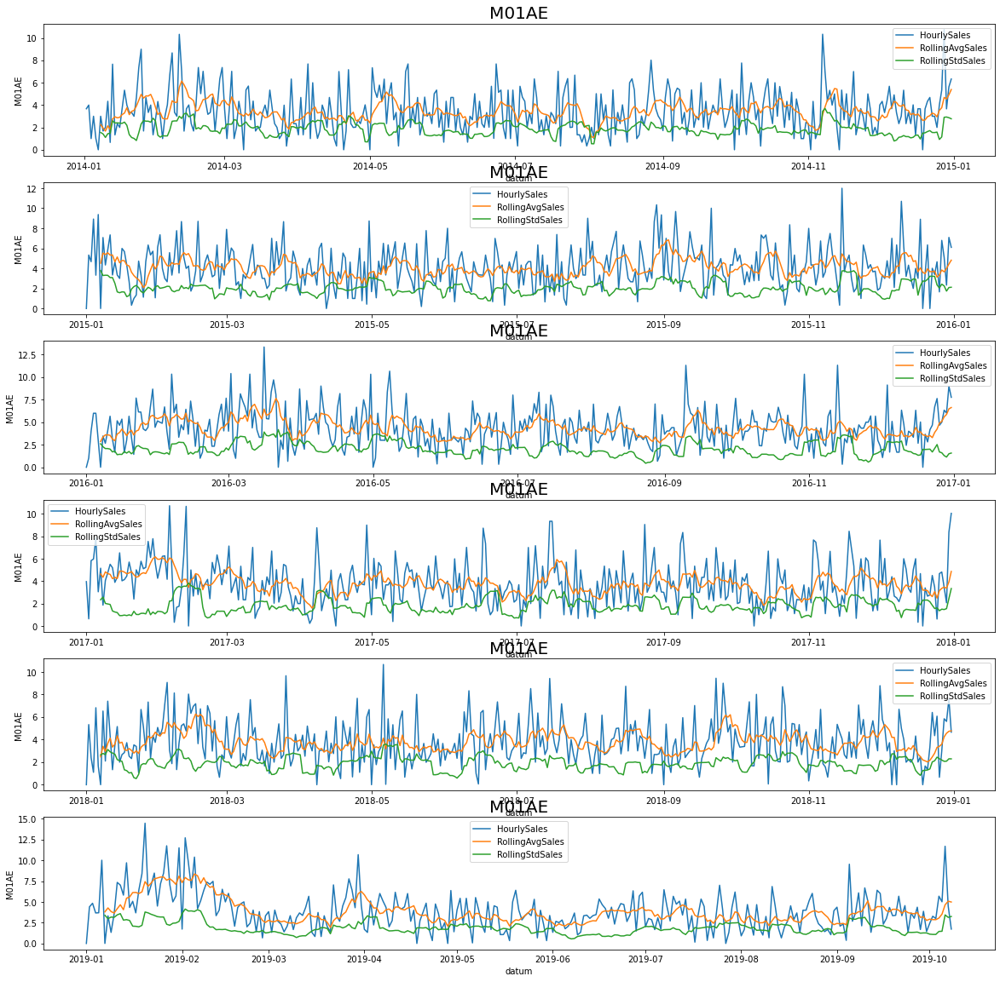

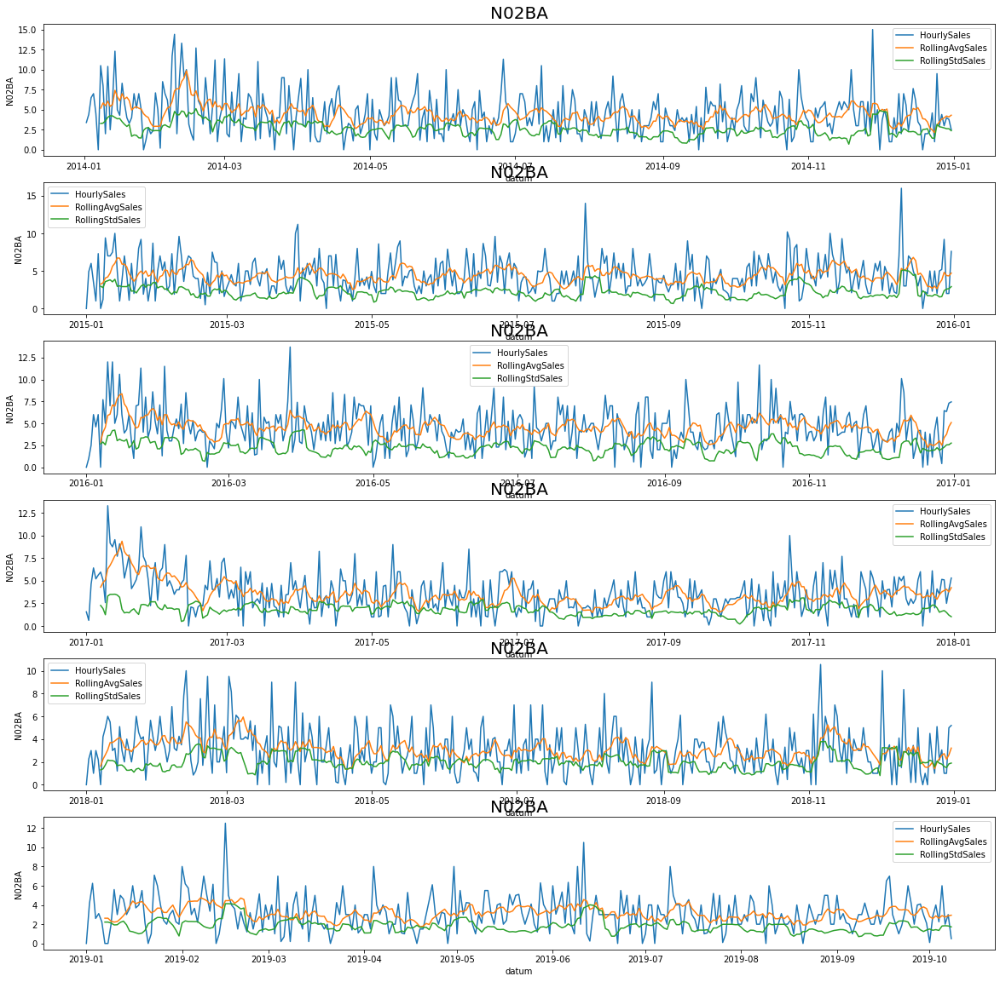

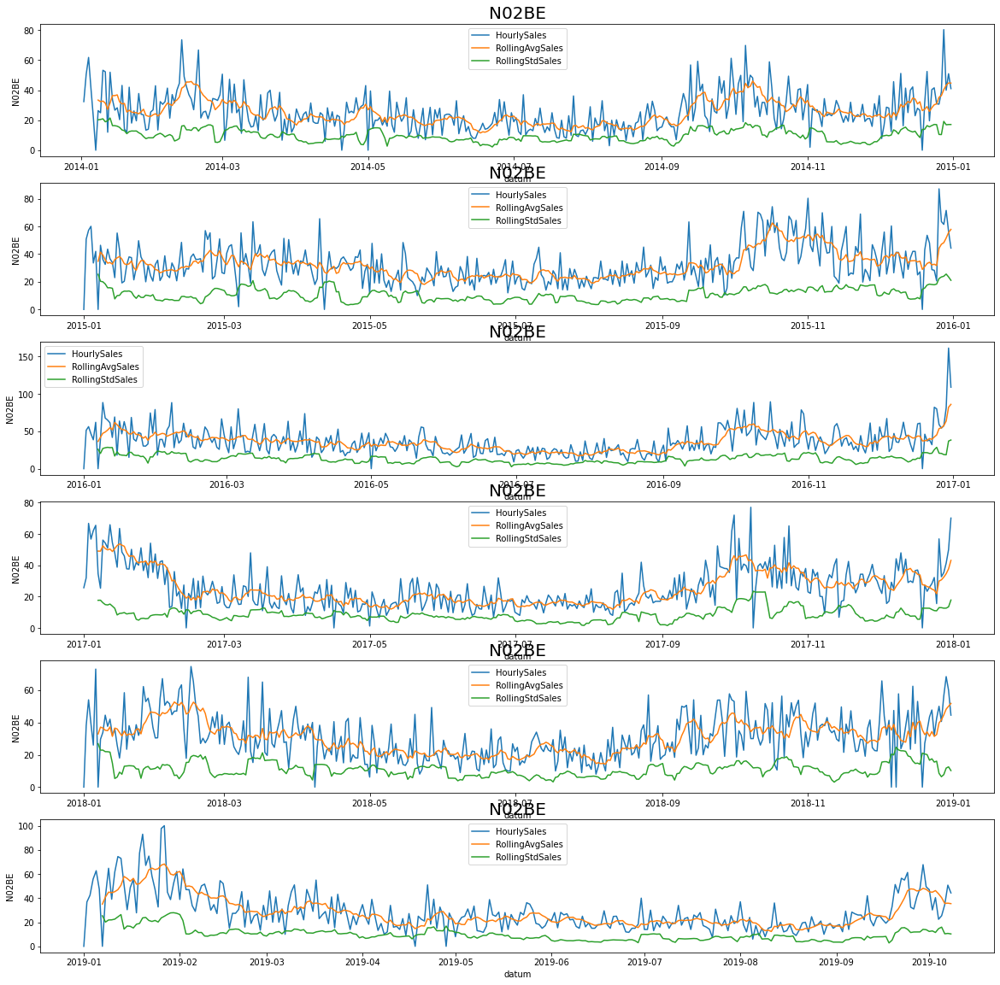

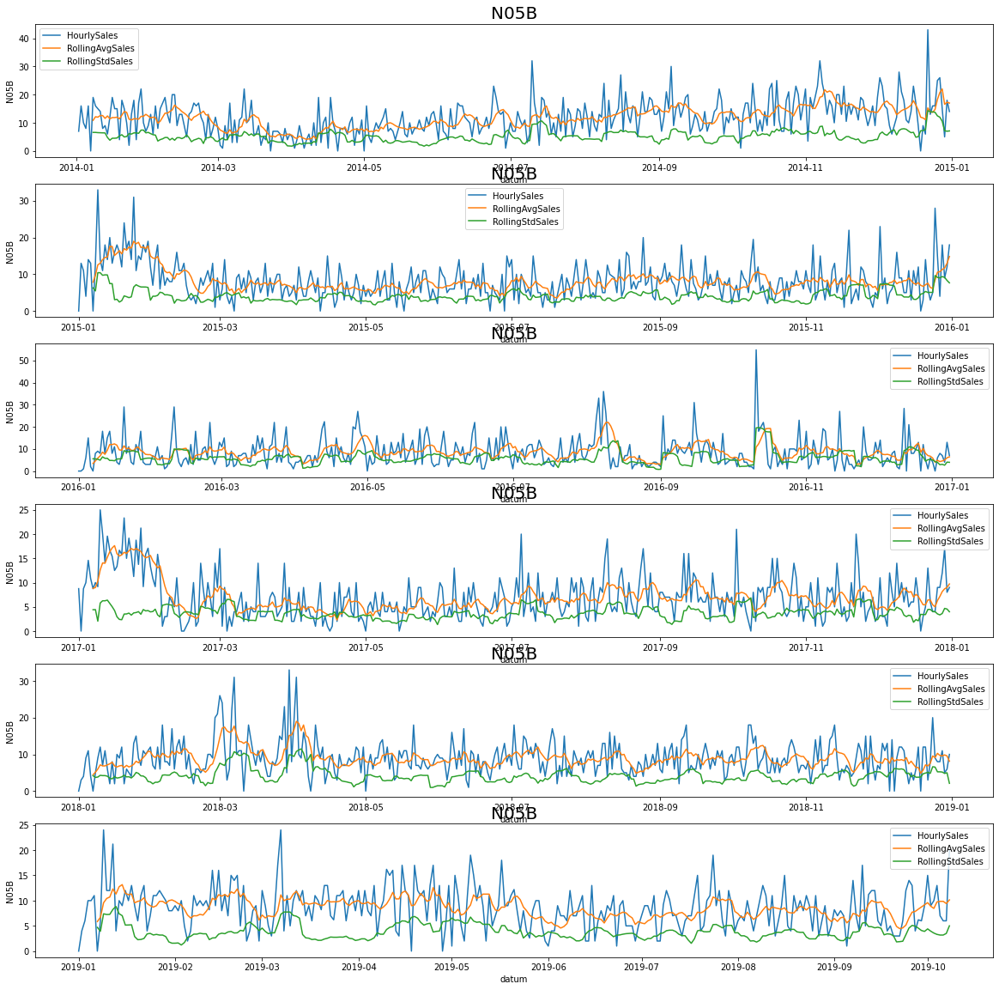

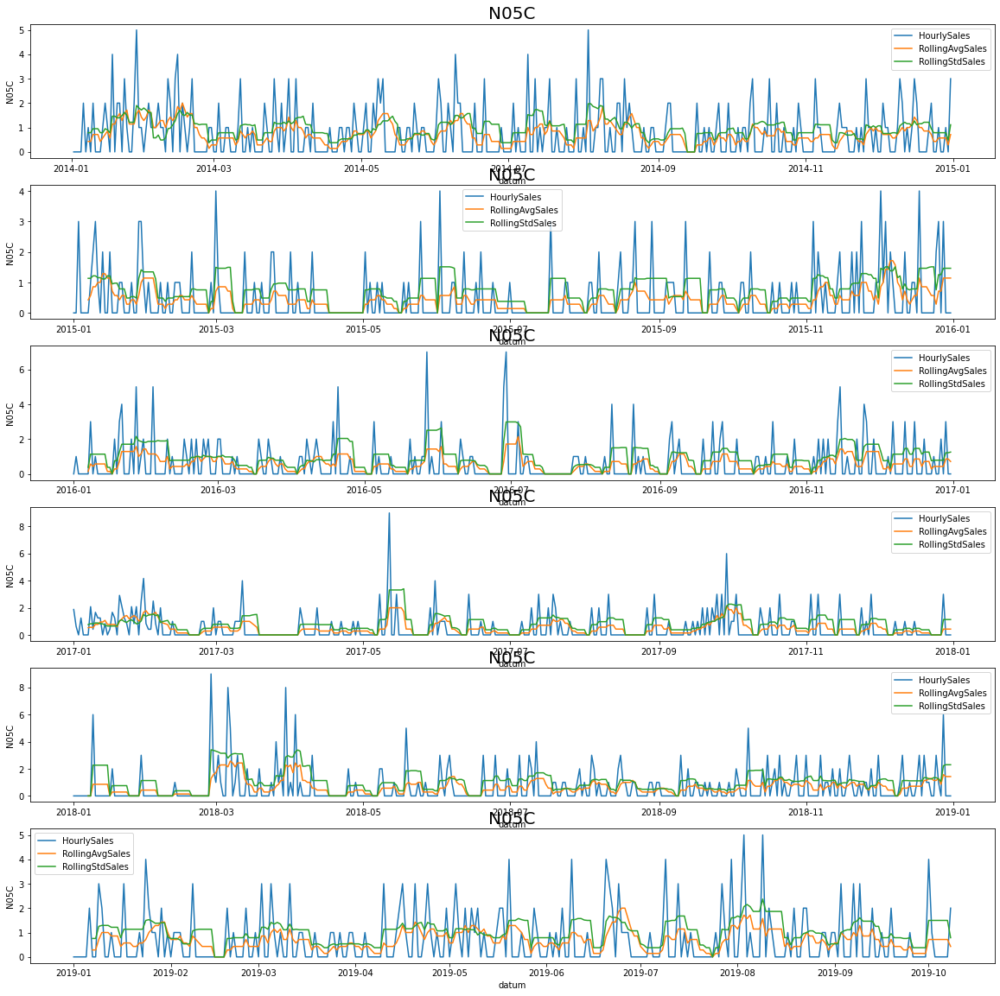

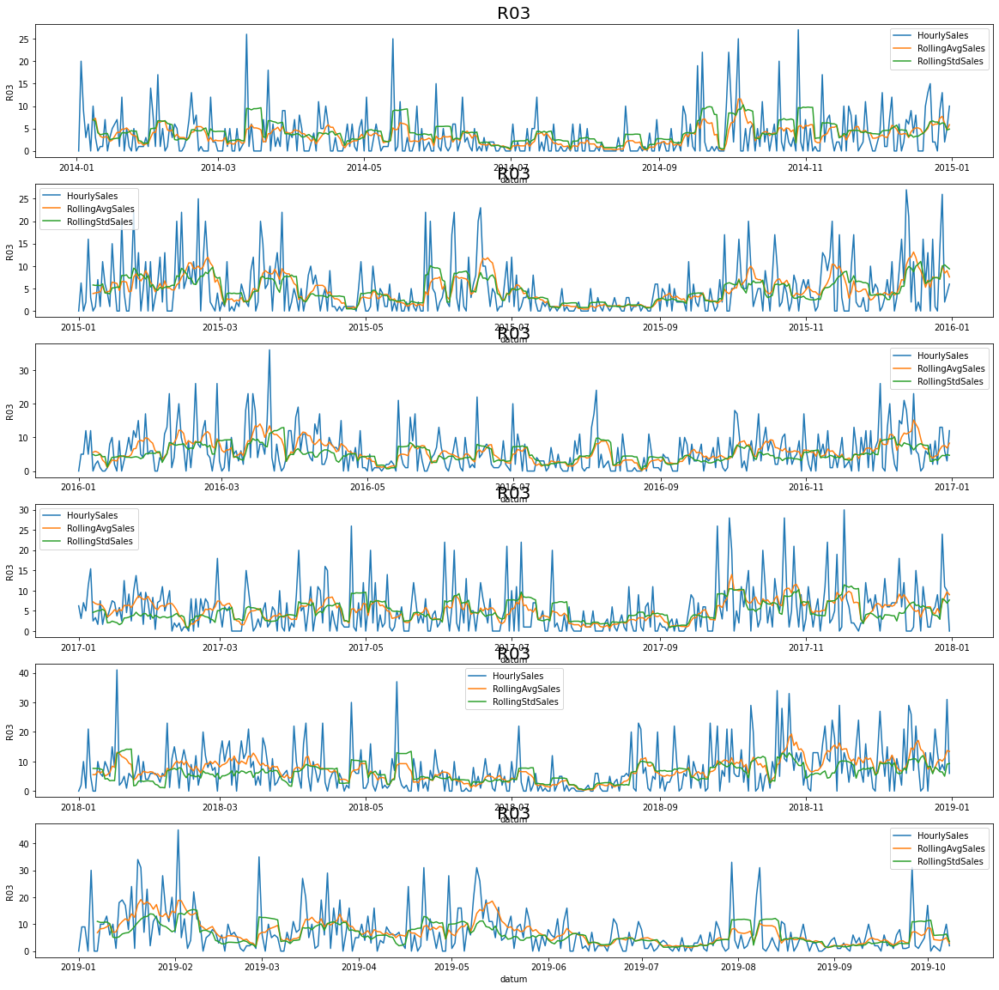

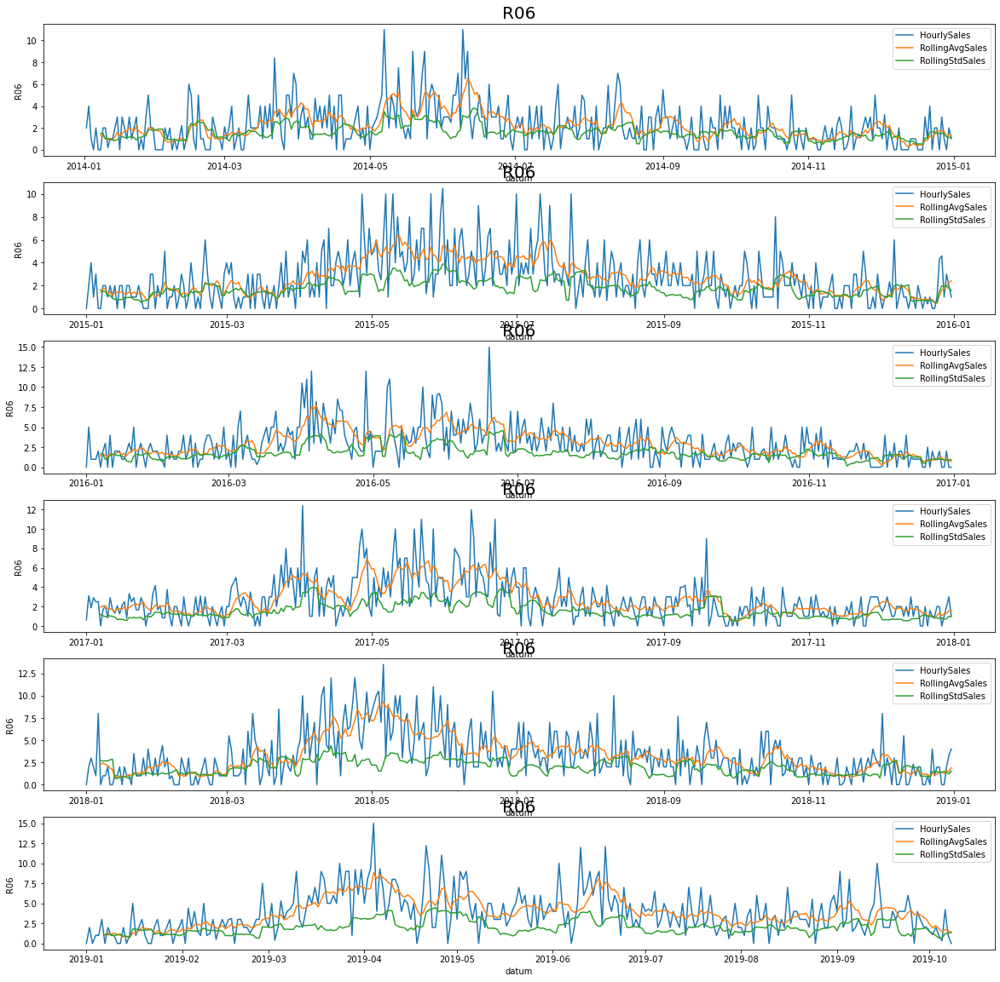

In [17]:
for col in cols:
    rolling_avg_graph(data,col)

## Seasonal Decompose

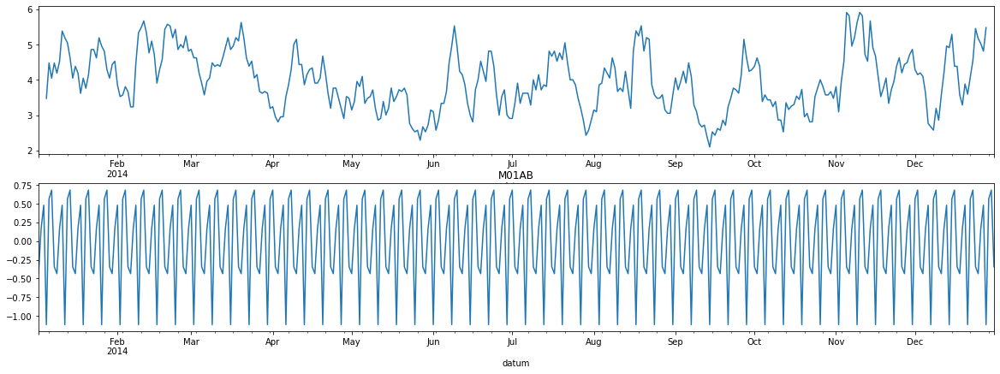

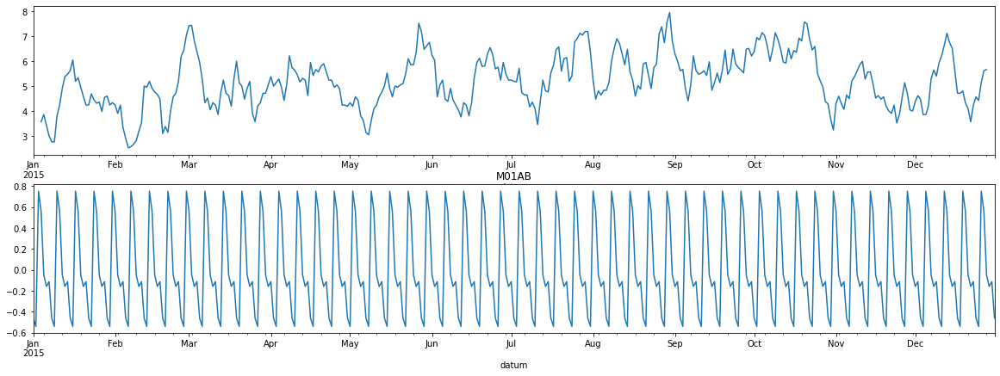

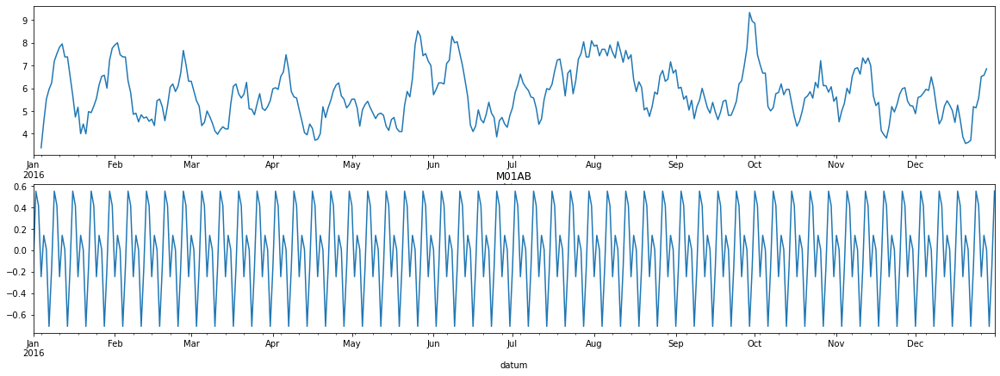

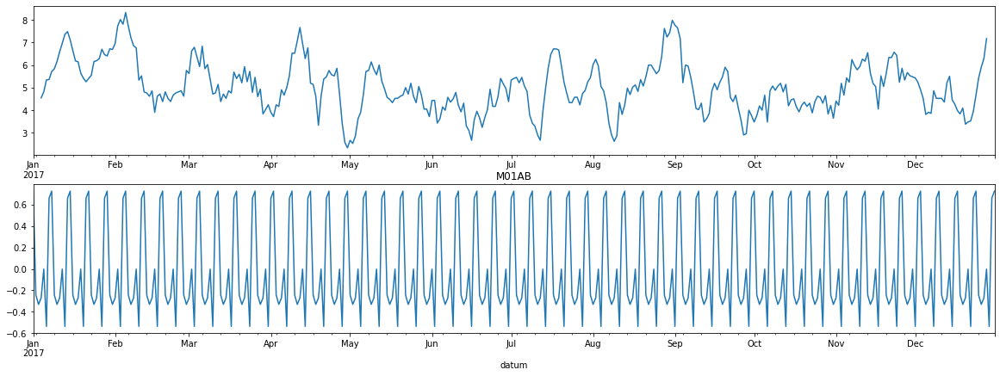

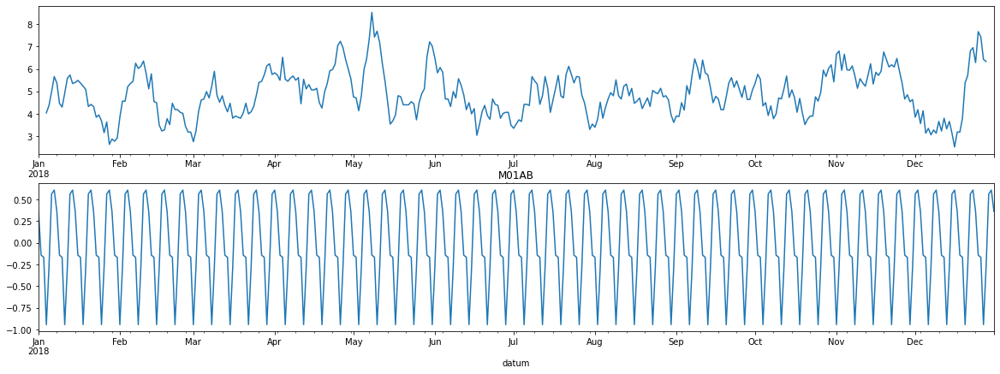

...

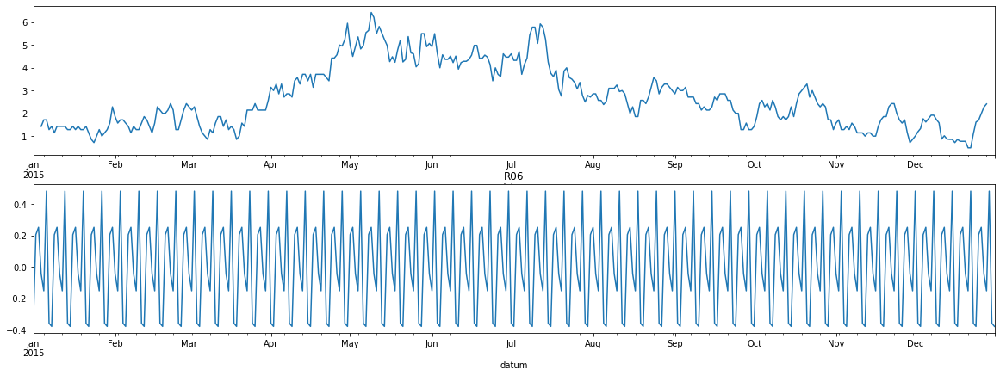

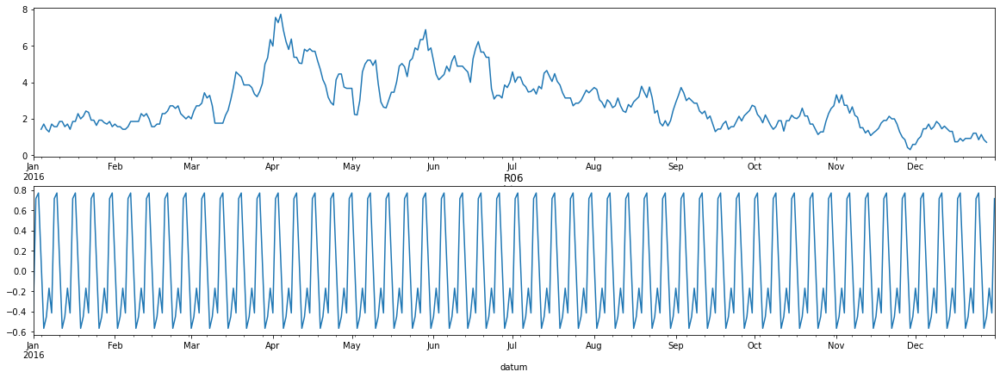

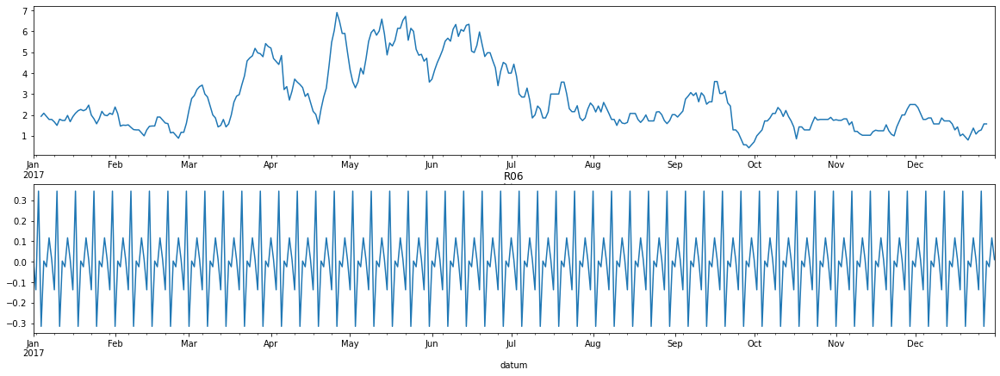

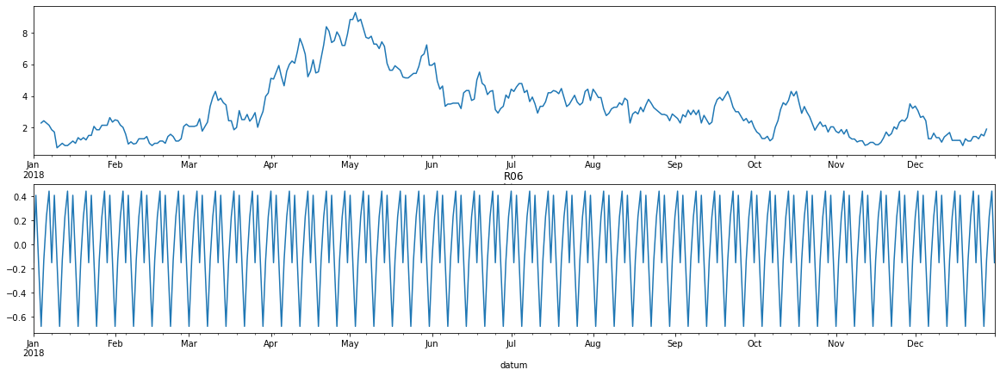

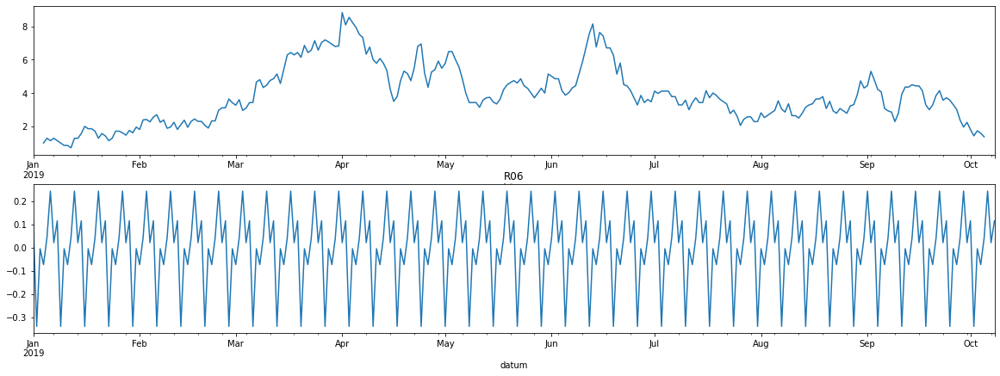

In [154]:
def seasonal_graph(data,col):
    for year in years:
        year_mask = data['Year'] == year
        mask_data = data[year_mask]
        res = seasonal_decompose(mask_data[col],model='additive')
        fig, (ax1,ax2) = plt.subplots(2,1, figsize=(20,7))
        res.trend.plot(ax=ax1)
        res.seasonal.plot(ax=ax2)
        plt.title(col)
for col in cols:
    seasonal_graph(data,col)

## Outliers

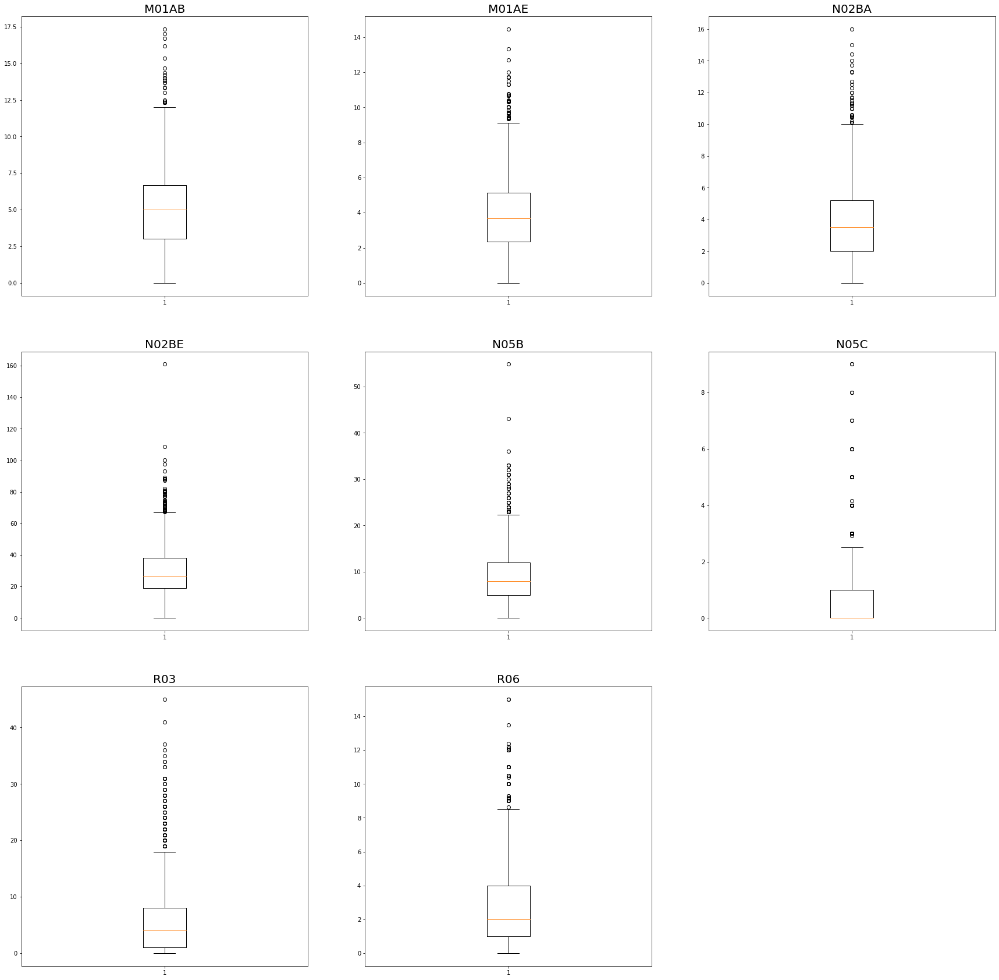

In [30]:
def plot_outlier(data,cols):
    fig = plt.figure(figsize=(30, 30))
    for loc, col in enumerate(cols):
        plt.subplot(3, 3, loc+1)
        plt.boxplot(x=data[col])
        plt.title(col,fontsize=20)
plot_outlier(data,data.columns[:8])
plt.show()

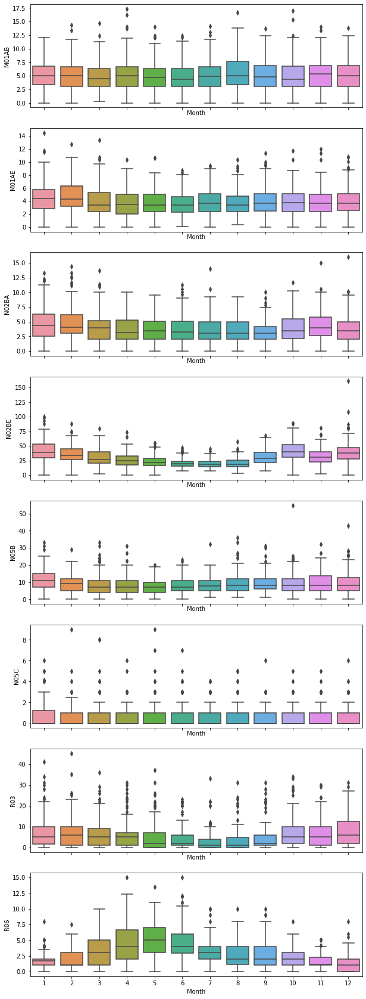

In [4]:
fig, axes = plt.subplots(8, 1, figsize=(10, 30), sharex=True)
for name, ax in zip(['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06'], axes):
    sns.boxplot(data=data, x='Month', y=name, ax=ax)

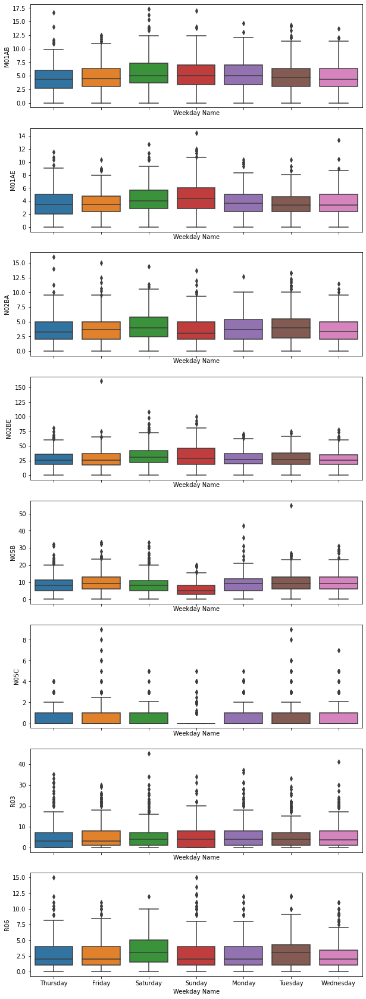

In [5]:
fig, axes = plt.subplots(8, 1, figsize=(10, 30), sharex=True)
for name, ax in zip(['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06'], axes):
    sns.boxplot(data=data, x='Weekday Name', y=name, ax=ax)

## Exponential Smoothing

## M01AB

In [4]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]

<AxesSubplot:xlabel='datum'>

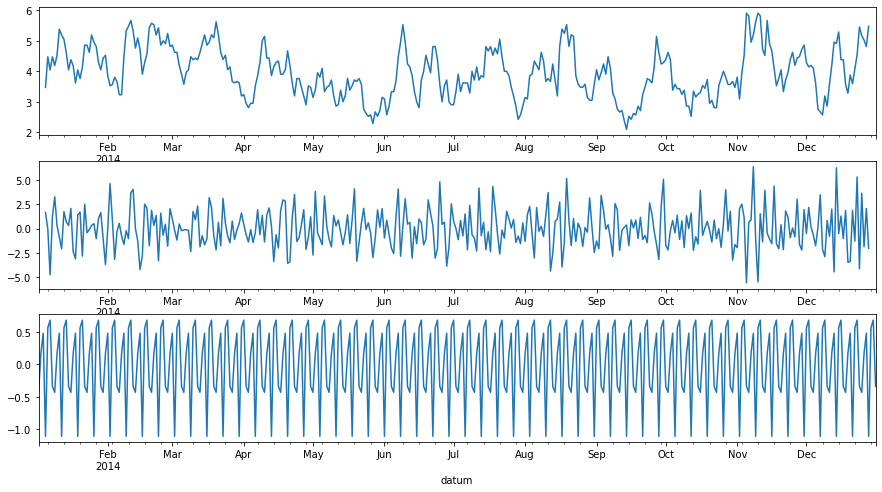

In [5]:
res = seasonal_decompose(mask_data["M01AB"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

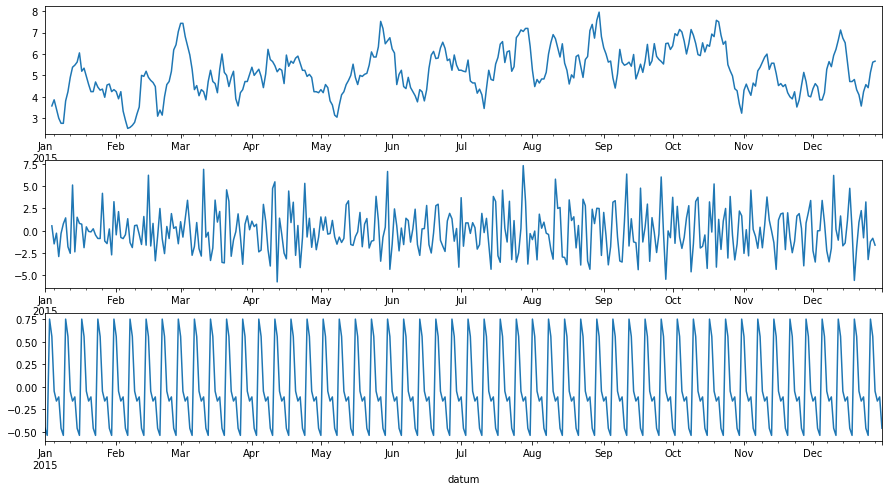

In [35]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["M01AB"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [11]:
df = data.loc[:,['M01AB']]
train = df[:-7]
test = df[-7:]

In [14]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

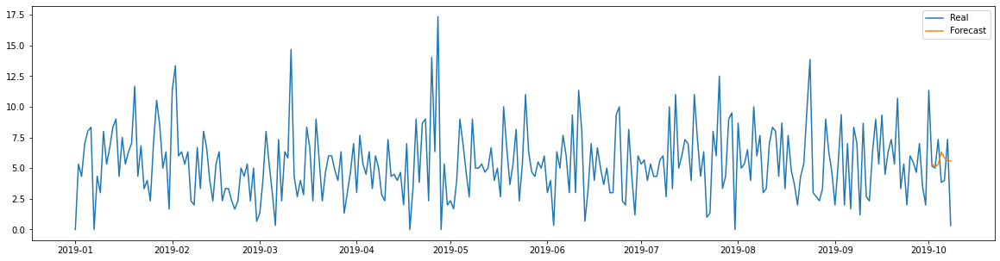

In [15]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['M01AB'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [16]:
mape = mean_absolute_percentage_error(test,predictions)
print(mape)

2.5213189196862595


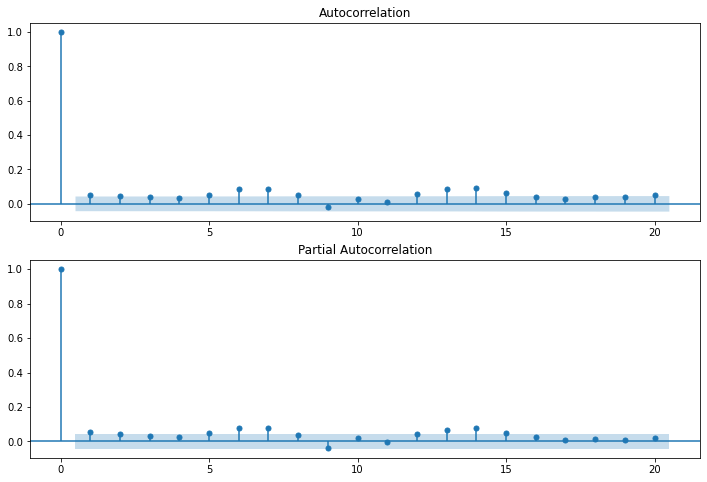

In [6]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["M01AB"],lags=20,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["M01AB"],lags=20,ax=ax2)

##### p = 0, 1, 2 ; q = 0, 1

In [7]:
stepwise_fit = auto_arima(data['M01AB'],trace = True,suppress_warnings=True,start_p=0,max_p=2,start_q=0,max_q=1,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=10221.364, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=10217.606, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=10218.058, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=13331.256, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=10215.740, Time=0.42 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=10181.946, Time=1.88 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=10177.432, Time=1.59 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=10152.762, Time=0.39 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=12374.478, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=11325.266, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=10154.742, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=10886.922, Time=0.11 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 5.756 seconds


In [12]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(1,0,1))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(1,0,1))
    model = model.fit()
    
    pred = model.predict(start = start,end = end-1,typ='levels')
    
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
    
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                  M01AB   No. Observations:                 2105
Model:                     ARMA(1, 1)   Log Likelihood               -5066.391
Method:                       css-mle   S.D. of innovations              2.685
Date:                Thu, 03 Jun 2021   AIC                          10140.782
Time:                        08:35:29   BIC                          10163.390
Sample:                    01-02-2014   HQIC                         10149.061
                         - 10-07-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           5.0116      0.327     15.342      0.000       4.371       5.652
ar.L1.M01AB     0.9972      0.002    474.525      0.000       0.993       1.001
ma.L1.M01AB    -0.9826      0.005   -199.278    

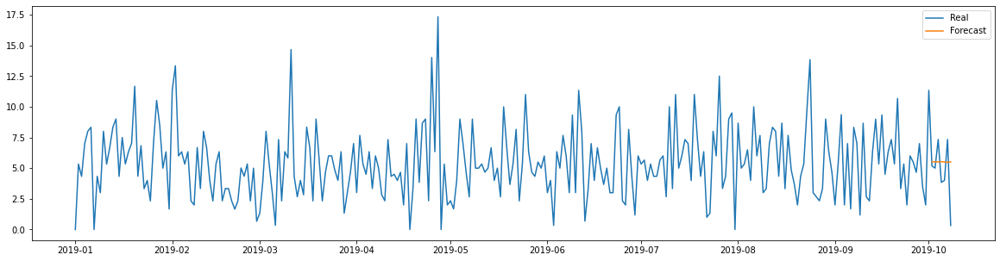

In [15]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['M01AB'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [13]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

2.364277646114826


In [4]:
stepwise_fit = auto_arima(data['M01AB'],trace = True,suppress_warnings=True,start_p=0,max_p=2,start_q=0,max_q=2,test='adf',d=None,seasonal=True,max_P=2,max_D=1,max_Q=2,m=7)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=4.69 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=10221.364, Time=0.10 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=10204.973, Time=1.58 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=10207.354, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=13331.256, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=10217.606, Time=0.38 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=10192.672, Time=3.32 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=8.34 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=3.64 sec
 ARIMA(0,0,0)(2,0,0)[7] intercept   : AIC=10192.624, Time=2.88 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=10206.510, Time=1.13 sec
 ARIMA(0,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=7.20 sec
 ARIMA(0,0,1)(2,0,0)[7] intercept   : AIC=10192.803, Time=3.22 sec
 ARIMA(1,0,1)(2,0,0)[7] intercept   : AIC=10187.512, Time=9.23 sec
 ARIMA(1,0,1)(1,0,0)[7] intercept   : AIC=1

In [8]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(1,0,1),seasonal_order=(2,0,0,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

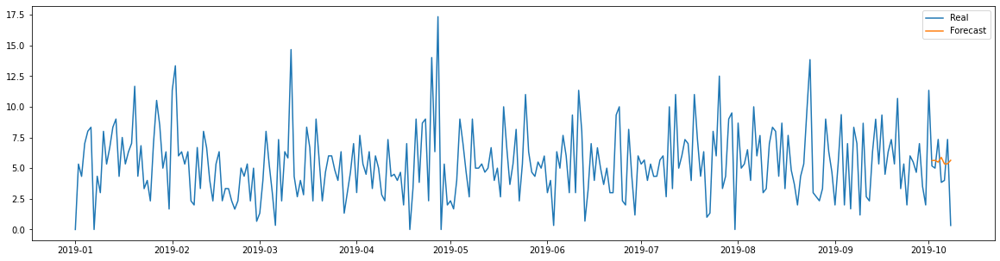

In [9]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['M01AB'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [10]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

2.452495215511001


## M01AE

<AxesSubplot:xlabel='datum'>

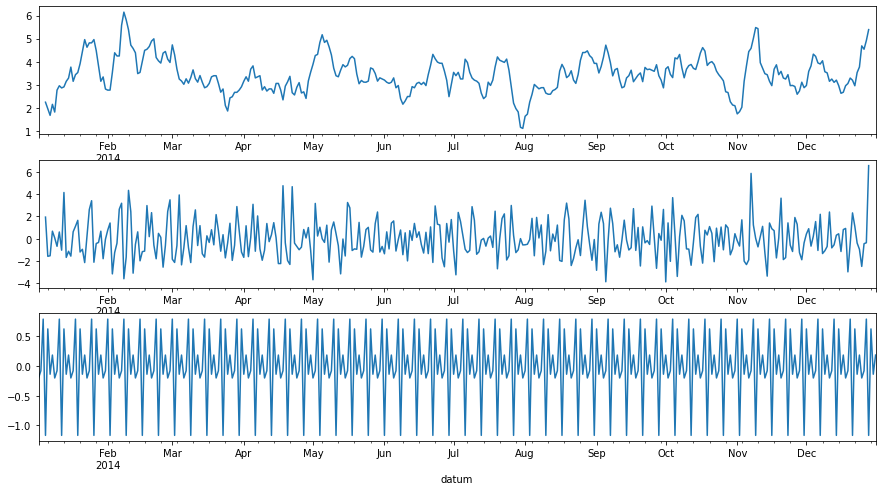

In [74]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["M01AE"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

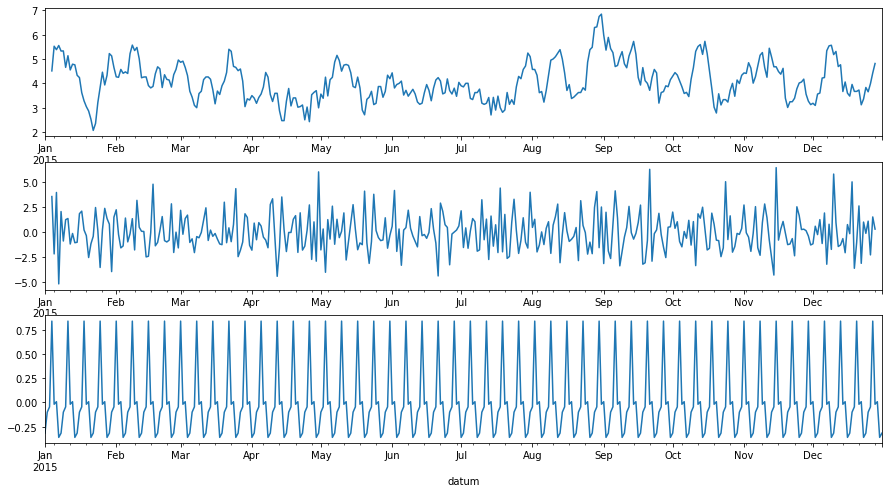

In [75]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["M01AE"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [18]:
df = data.loc[:,['M01AE']]
train = df[:-7]
test = df[-7:]

In [139]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

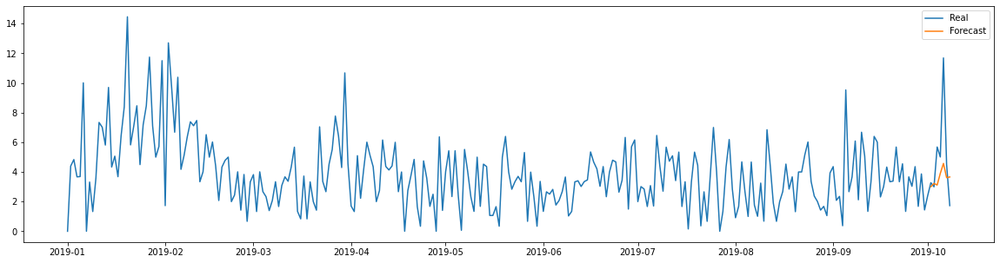

In [140]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['M01AE'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [141]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

3.001334164910547


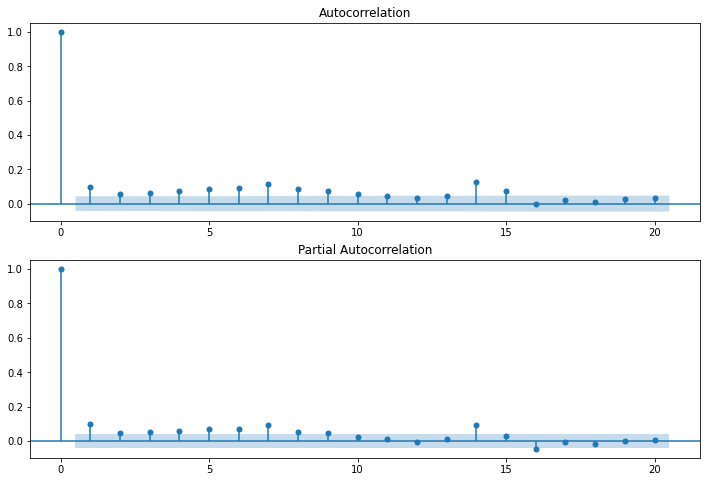

In [16]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["M01AE"],lags=20,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["M01AE"],lags=20,ax=ax2)

##### p = 0-10 ; q = 0-7

In [17]:
stepwise_fit = auto_arima(data['M01AE'],trace = True,suppress_warnings=True,start_p=0,max_p=10,start_q=0,max_q=7,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=9170.947, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=9152.410, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=9154.251, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=12258.578, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=9149.346, Time=0.21 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=9146.074, Time=0.32 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=9140.782, Time=0.37 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=9132.892, Time=0.86 sec
 ARIMA(6,0,0)(0,0,0)[0] intercept   : AIC=9125.093, Time=0.91 sec
 ARIMA(7,0,0)(0,0,0)[0] intercept   : AIC=9109.129, Time=1.15 sec
 ARIMA(8,0,0)(0,0,0)[0] intercept   : AIC=9104.968, Time=1.36 sec
 ARIMA(9,0,0)(0,0,0)[0] intercept   : AIC=9102.767, Time=1.61 sec
 ARIMA(10,0,0)(0,0,0)[0] intercept   : AIC=9103.603, Time=1.61 sec
 ARIMA(9,0,1)(0,0,0)[0] intercept   : AIC=9101.406, Time=5.97 sec
 ARIMA(8,0,1)(0,0,0)[0] interce

In [19]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(5,0,1))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(5,0,1))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                  M01AE   No. Observations:                 2105
Model:                     ARMA(5, 1)   Log Likelihood               -4538.176
Method:                       css-mle   S.D. of innovations              2.089
Date:                Thu, 03 Jun 2021   AIC                           9092.352
Time:                        08:57:01   BIC                           9137.568
Sample:                    01-02-2014   HQIC                          9108.911
                         - 10-07-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           3.8945      0.098     39.686      0.000       3.702       4.087
ar.L1.M01AE     0.8944      0.047     18.897      0.000       0.802       0.987
ar.L2.M01AE    -0.0321      0.029     -1.088    

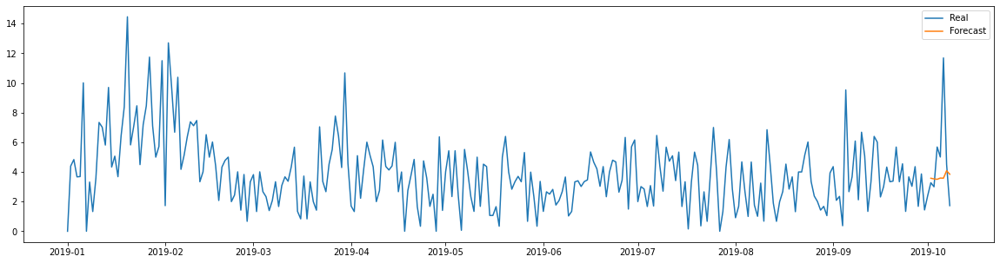

In [23]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['M01AE'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [20]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

3.328619328986856


In [14]:
stepwise_fit = auto_arima(data['M01AE'],trace = True,suppress_warnings=True,start_p=0,max_p=4,start_q=0,max_q=14,test='adf',d=None,seasonal=True,max_P=4,max_D=1,max_Q=14,m=7)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=4.41 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=9170.947, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=9132.477, Time=1.41 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=9137.499, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=12258.578, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=9152.410, Time=0.26 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=9109.803, Time=2.99 sec
 ARIMA(1,0,0)(3,0,0)[7] intercept   : AIC=9099.720, Time=6.81 sec
 ARIMA(1,0,0)(4,0,0)[7] intercept   : AIC=9095.121, Time=12.36 sec
 ARIMA(1,0,0)(4,0,1)[7] intercept   : AIC=inf, Time=30.55 sec
 ARIMA(1,0,0)(3,0,1)[7] intercept   : AIC=inf, Time=17.23 sec
 ARIMA(0,0,0)(4,0,0)[7] intercept   : AIC=9106.130, Time=8.61 sec
 ARIMA(2,0,0)(4,0,0)[7] intercept   : AIC=9093.995, Time=6.49 sec
 ARIMA(2,0,0)(3,0,0)[7] intercept   : AIC=9098.563, Time=3.23 sec
 ARIMA(2,0,0)(4,0,1)[7] intercept   : AIC=in

In [15]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(3,0,1),seasonal_order=(4,0,0,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

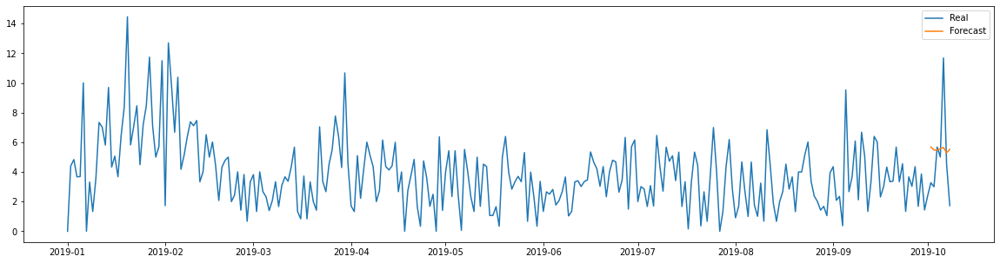

In [16]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['M01AE'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [17]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

2.417778703365261


## N02BA

<AxesSubplot:xlabel='datum'>

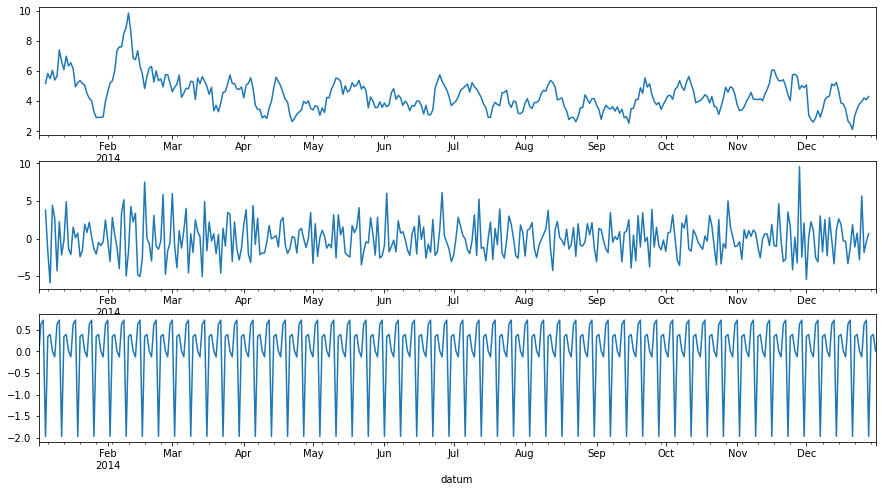

In [59]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N02BA"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

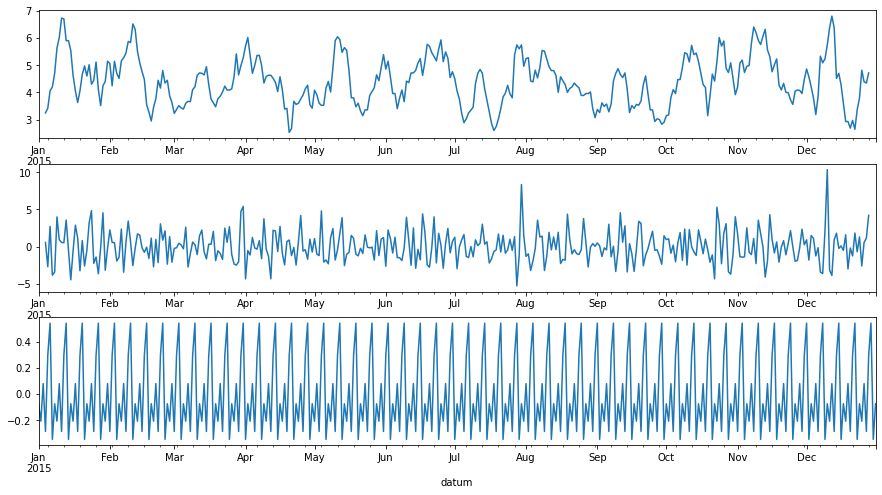

In [60]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N02BA"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [21]:
df = data.loc[:,['N02BA']]
train = df[:-7]
test = df[-7:]

In [143]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

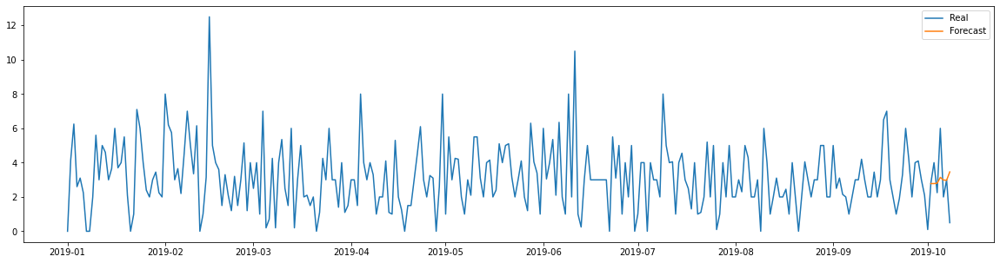

In [144]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N02BA'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [145]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

1.6777696449806996


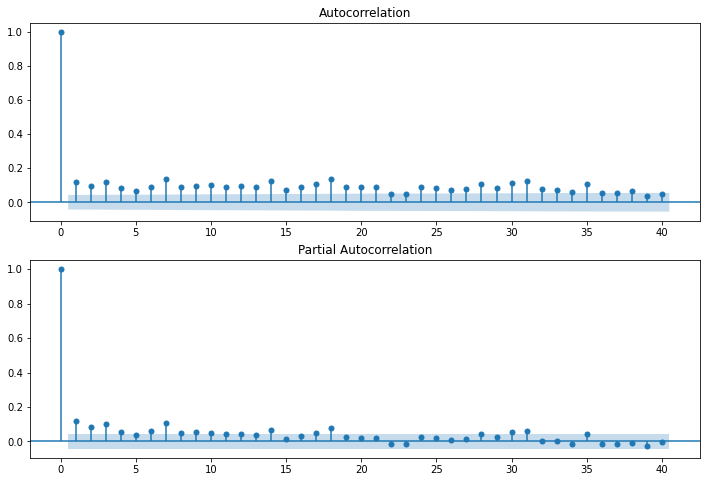

In [25]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["N02BA"],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["N02BA"],lags=40,ax=ax2)

##### p = 0 , 1, 2, 3; q = 0-22

In [22]:
stepwise_fit = auto_arima(data['N02BA'],trace = True,suppress_warnings=True,start_p=0,max_p=3,start_q=0,max_q=22,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=9638.887, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=9611.422, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=9615.441, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=12363.957, Time=0.03 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=9598.878, Time=0.23 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=9579.485, Time=0.39 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=9485.780, Time=2.35 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=9484.019, Time=1.86 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=9483.514, Time=1.78 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=9483.373, Time=1.99 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=9606.875, Time=0.34 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=9481.721, Time=2.33 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=9481.917, Time=2.53 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=9481.832, Time=3.63 sec
 ARIMA(1,0,3)(0,0,0)[0] intercep

In [23]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(1,1,1))

for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(2,0,2))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                  N02BA   No. Observations:                 2105
Model:                     ARMA(2, 2)   Log Likelihood               -4731.491
Method:                       css-mle   S.D. of innovations              2.290
Date:                Thu, 03 Jun 2021   AIC                           9474.981
Time:                        08:59:55   BIC                           9508.894
Sample:                    01-02-2014   HQIC                          9487.401
                         - 10-07-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           3.9562      0.435      9.098      0.000       3.104       4.808
ar.L1.N02BA     1.3155      0.357      3.684      0.000       0.616       2.015
ar.L2.N02BA    -0.3173      0.356     -0.891    

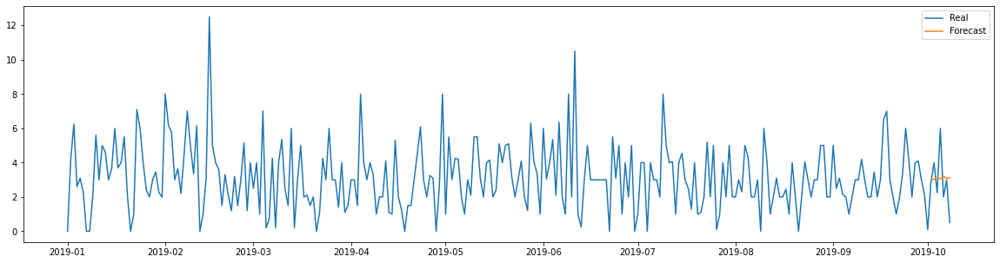

In [24]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N02BA'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [25]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

1.6317446877272146


In [26]:
stepwise_fit = auto_arima(data['N02BA'],trace = True,suppress_warnings=True,start_p=0,max_p=3,start_q=0,max_q=7,test='adf',seasonal=True,max_P=3,max_D=1,max_Q=7,m=7)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=1.86 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=9638.887, Time=0.97 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=9582.036, Time=0.73 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=9589.941, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=12363.957, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=9611.422, Time=0.14 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=9564.237, Time=1.42 sec
 ARIMA(1,0,0)(3,0,0)[7] intercept   : AIC=9558.996, Time=3.32 sec
 ARIMA(1,0,0)(3,0,1)[7] intercept   : AIC=inf, Time=8.01 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=3.17 sec
 ARIMA(0,0,0)(3,0,0)[7] intercept   : AIC=9571.591, Time=2.86 sec
 ARIMA(2,0,0)(3,0,0)[7] intercept   : AIC=9554.508, Time=3.81 sec
 ARIMA(2,0,0)(2,0,0)[7] intercept   : AIC=9558.934, Time=1.38 sec
 ARIMA(2,0,0)(3,0,1)[7] intercept   : AIC=inf, Time=8.57 sec
 ARIMA(2,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=

In [27]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(2,0,3),seasonal_order=(0,0,2,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

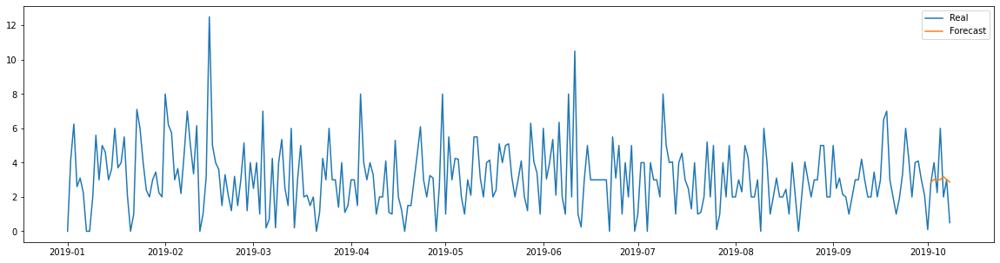

In [28]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N02BA'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [29]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

1.576160723056308


## N02BE

<AxesSubplot:xlabel='datum'>

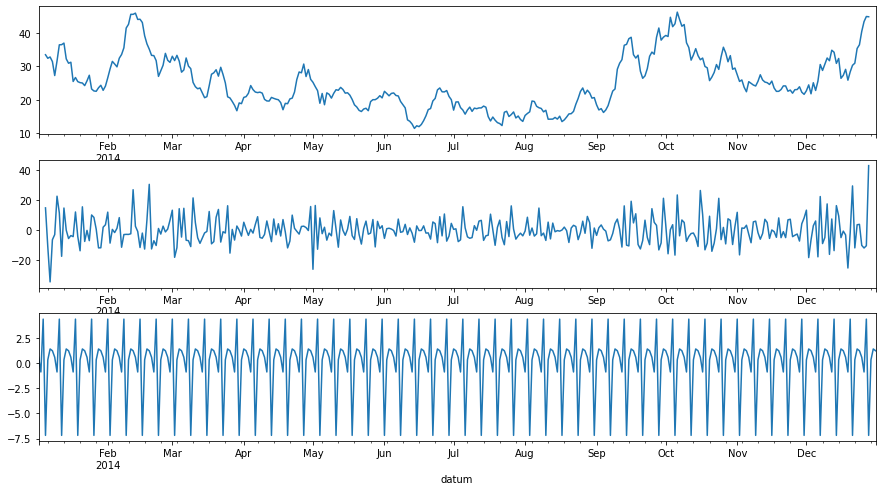

In [80]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N02BE"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

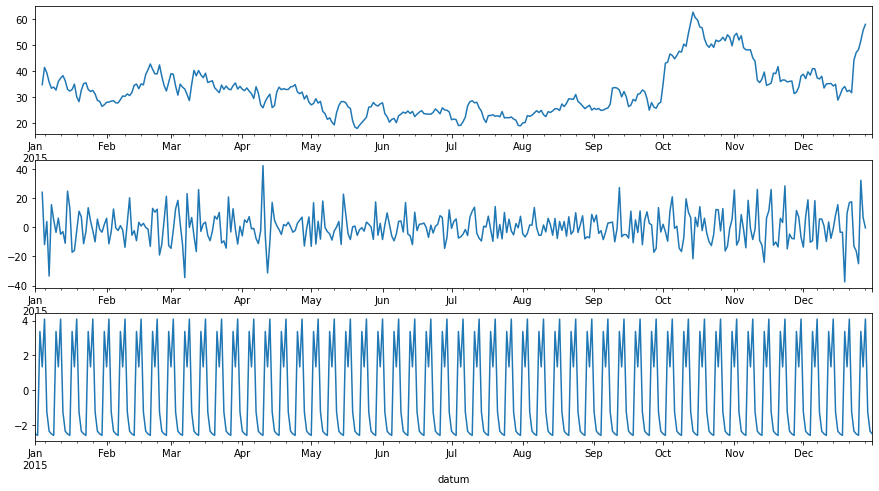

In [85]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N02BE"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [30]:
df = data.loc[:,['N02BE']]
train = df[:-7]
test = df[-7:]

In [147]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

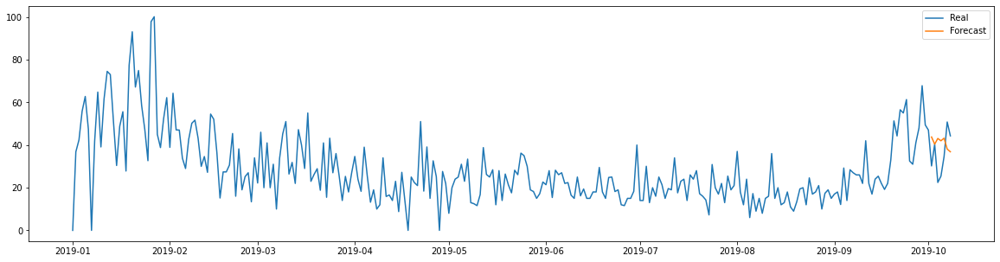

In [148]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N02BE'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [149]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

12.956736968793361


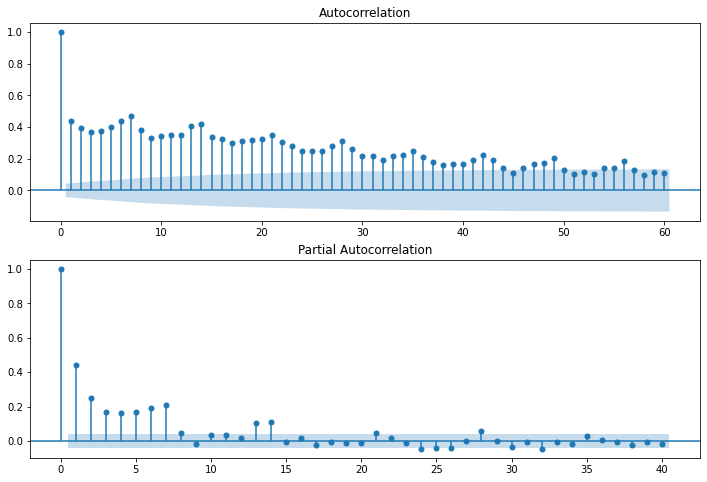

In [42]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["N02BE"],lags=60,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["N02BE"],lags=40,ax=ax2)

##### p = 0-7 ; q = 0-50

In [43]:
stepwise_fit = auto_arima(data['N02BE'],trace = True,suppress_warnings=True,start_p=0,max_p=7,start_q=0,max_q=50,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=17548.634, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=17095.862, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=17256.711, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=20798.541, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=16960.894, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=16901.419, Time=0.36 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=16848.558, Time=0.31 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=16789.211, Time=0.70 sec
 ARIMA(6,0,0)(0,0,0)[0] intercept   : AIC=16711.176, Time=0.75 sec
 ARIMA(7,0,0)(0,0,0)[0] intercept   : AIC=16618.287, Time=1.06 sec
 ARIMA(7,0,1)(0,0,0)[0] intercept   : AIC=16616.633, Time=1.92 sec
 ARIMA(6,0,1)(0,0,0)[0] intercept   : AIC=16630.518, Time=2.31 sec
 ARIMA(7,0,2)(0,0,0)[0] intercept   : AIC=16618.445, Time=3.45 sec
 ARIMA(6,0,2)(0,0,0)[0] intercept   : AIC=16631.826, Time=4.19 sec
 ARIMA(7,0,1)(0,0,0

In [31]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(7,0,1))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(7,0,1))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                  N02BE   No. Observations:                 2105
Model:                     ARMA(7, 1)   Log Likelihood               -8294.761
Method:                       css-mle   S.D. of innovations             12.444
Date:                Thu, 03 Jun 2021   AIC                          16609.522
Time:                        09:15:36   BIC                          16666.043
Sample:                    01-02-2014   HQIC                         16630.221
                         - 10-07-2019                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const          30.0689      1.808     16.628      0.000      26.525      33.613
ar.L1.N02BE     0.3359      0.098      3.437      0.001       0.144       0.527
ar.L2.N02BE     0.0585      0.029      2.011    

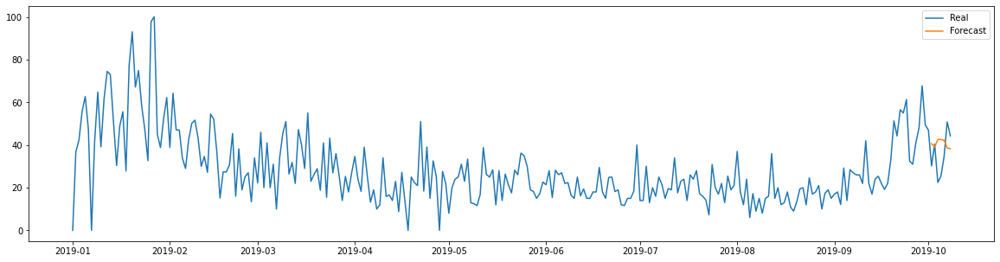

In [32]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N02BE'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [33]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

12.27296681009212


In [34]:
stepwise_fit = auto_arima(data['N02BE'],trace = True,suppress_warnings=True,start_p=0,max_p=7,start_q=0,max_q=50,test='adf',seasonal=True,max_P=2,max_D=1,max_Q=4,m=7)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=16839.560, Time=1.83 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=17548.634, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=16912.064, Time=1.04 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=17060.728, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=20798.541, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=17216.378, Time=0.36 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=17018.549, Time=0.78 sec
 ARIMA(0,0,0)(2,0,1)[7] intercept   : AIC=16840.871, Time=3.85 sec
 ARIMA(0,0,0)(1,0,2)[7] intercept   : AIC=16841.050, Time=3.74 sec
 ARIMA(0,0,0)(0,0,2)[7] intercept   : AIC=17053.548, Time=0.88 sec
 ARIMA(0,0,0)(2,0,0)[7] intercept   : AIC=16879.634, Time=1.65 sec
 ARIMA(0,0,0)(2,0,2)[7] intercept   : AIC=inf, Time=5.52 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=16763.477, Time=2.46 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=16979.028, Time=0.76 sec
 ARIMA(1,0,0)(2,0,1)[7] i

In [35]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(6,0,0),seasonal_order=(1,0,1,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

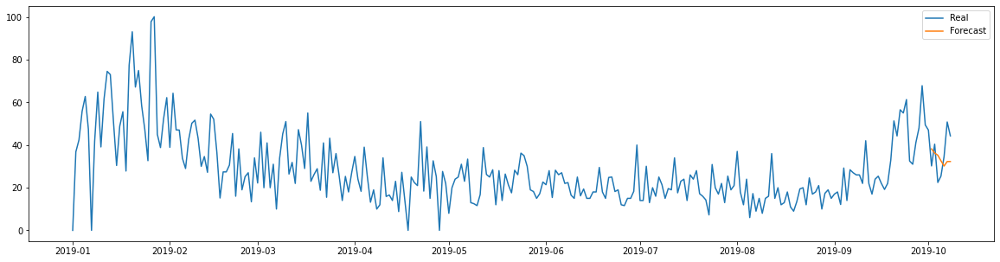

In [36]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N02BE'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [37]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

10.721608750560664


## N05B

<AxesSubplot:xlabel='datum'>

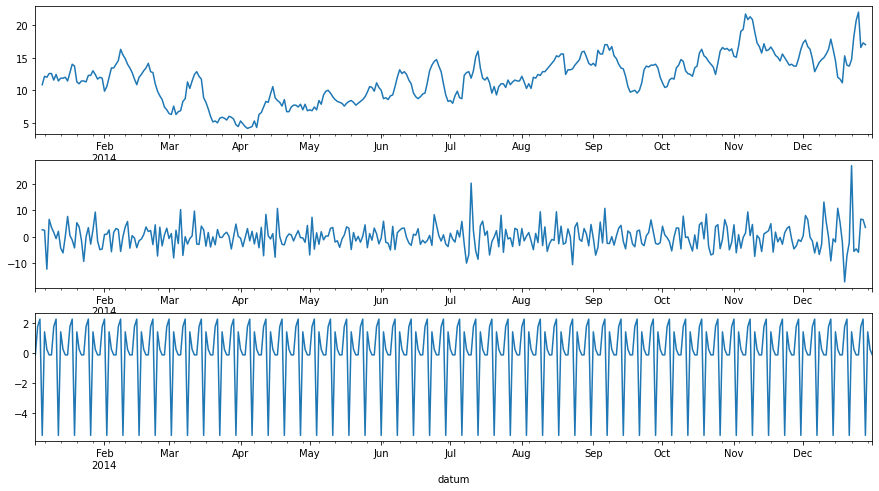

In [88]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N05B"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

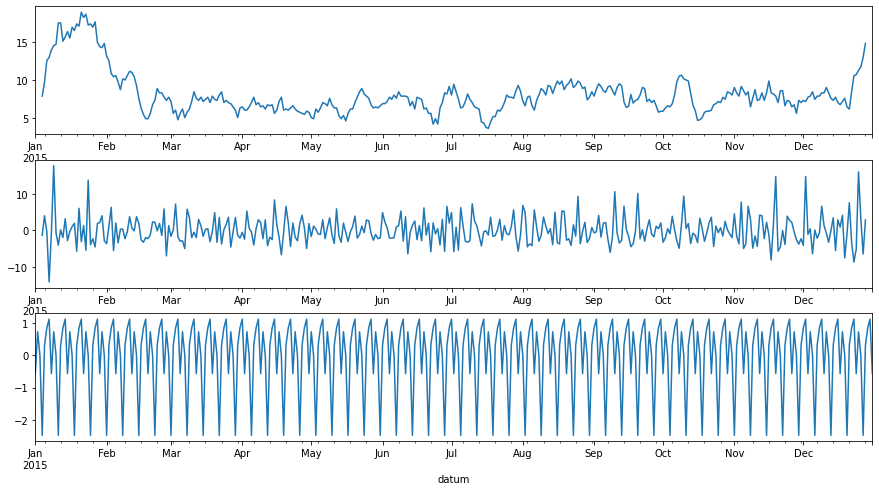

In [89]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N05B"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [47]:
df = data.loc[:,['N05B']]
train = df[:-7]
test = df[-7:]

In [122]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

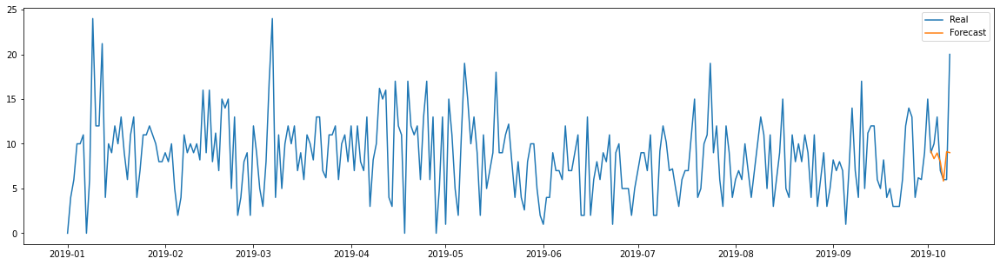

In [123]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N05B'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [124]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

4.636407628911251


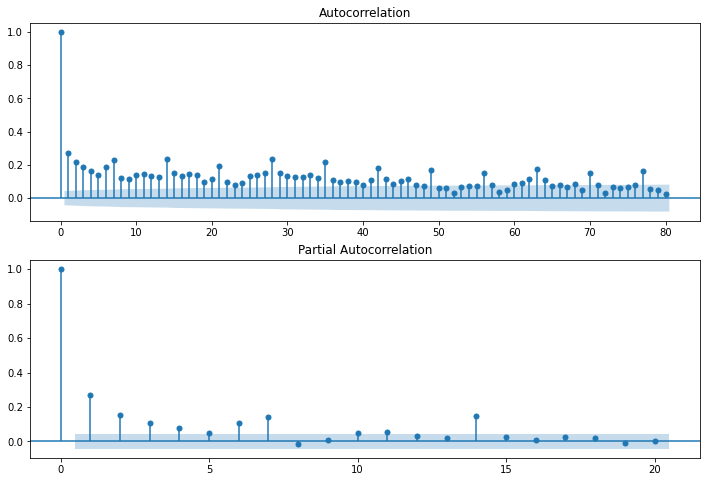

In [51]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["N05B"],lags=80,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["N05B"],lags=20,ax=ax2)

##### p = 0-7 ; q = 0-40

In [52]:
stepwise_fit = auto_arima(data['N05B'],trace = True,suppress_warnings=True,start_p=0,max_p=7,start_q=0,max_q=40,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=13240.075, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=13083.192, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=13121.726, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=15873.844, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=13035.160, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=13012.760, Time=0.20 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=13002.191, Time=0.44 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=12998.606, Time=0.57 sec
 ARIMA(6,0,0)(0,0,0)[0] intercept   : AIC=12976.952, Time=1.01 sec
 ARIMA(7,0,0)(0,0,0)[0] intercept   : AIC=12937.013, Time=1.26 sec
 ARIMA(7,0,1)(0,0,0)[0] intercept   : AIC=12938.478, Time=2.38 sec
 ARIMA(6,0,1)(0,0,0)[0] intercept   : AIC=12921.371, Time=3.17 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=12922.115, Time=3.87 sec
 ARIMA(6,0,2)(0,0,0)[0] intercept   : AIC=12923.050, Time=4.78 sec
 ARIMA(5,0,2)(0,0,0

In [39]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(6,0,1))
for train_end in test.index:
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(6,0,1))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                   N05B   No. Observations:                 2105
Model:                     ARMA(6, 1)   Log Likelihood               -6445.182
Method:                       css-mle   S.D. of innovations              5.169
Date:                Thu, 03 Jun 2021   AIC                          12908.364
Time:                        09:24:18   BIC                          12959.232
Sample:                    01-02-2014   HQIC                         12926.993
                         - 10-07-2019                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.9127      0.671     13.280      0.000       7.597      10.228
ar.L1.N05B     1.0978      0.026     42.185      0.000       1.047       1.149
ar.L2.N05B    -0.0707      0.032     -2.178      0.0

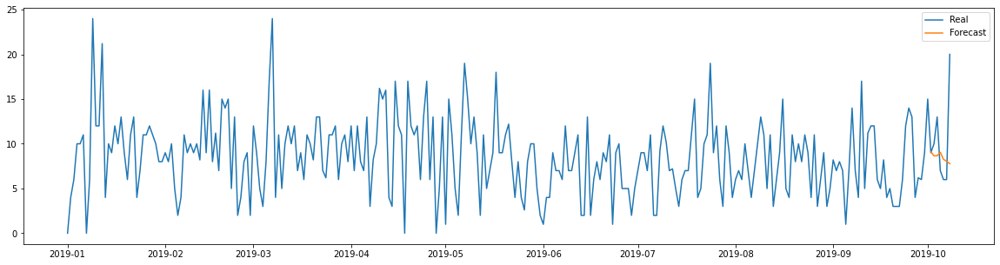

In [40]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N05B'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [41]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

5.119358475941783


In [42]:
stepwise_fit = auto_arima(data['N05B'],trace = True,suppress_warnings=True,m=7)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[7] intercept   : AIC=inf, Time=3.94 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=14030.428, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=13497.279, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=12935.259, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=14028.430, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=12943.190, Time=0.51 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=inf, Time=3.24 sec
 ARIMA(0,1,1)(0,0,2)[7] intercept   : AIC=12923.025, Time=1.30 sec
 ARIMA(0,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=5.12 sec
 ARIMA(0,1,0)(0,0,2)[7] intercept   : AIC=13991.356, Time=0.60 sec
 ARIMA(1,1,1)(0,0,2)[7] intercept   : AIC=12891.106, Time=2.44 sec
 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=12907.234, Time=0.90 sec
 ARIMA(1,1,1)(1,0,2)[7] intercept   : AIC=inf, Time=6.84 sec
 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=inf, Time=3.55 sec
 ARIMA(1,1,0)(0,0,2)[7] intercept   : AIC=13482.8

In [43]:
stepwise_fit = auto_arima(data['N05B'],trace = True,suppress_warnings=True,start_p=0,max_p=7,start_q=0,max_q=40,test='adf',seasonal=True,max_P=7,max_D=1,max_Q=40,m=7)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=12922.108, Time=1.47 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=13240.075, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=13013.412, Time=0.78 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=13061.517, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=15873.844, Time=0.02 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=13157.659, Time=0.27 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=13124.963, Time=0.63 sec
 ARIMA(0,0,0)(2,0,1)[7] intercept   : AIC=12923.558, Time=4.01 sec
 ARIMA(0,0,0)(1,0,2)[7] intercept   : AIC=12923.555, Time=3.98 sec
 ARIMA(0,0,0)(0,0,2)[7] intercept   : AIC=13096.496, Time=1.20 sec
 ARIMA(0,0,0)(2,0,0)[7] intercept   : AIC=13048.634, Time=1.20 sec
 ARIMA(0,0,0)(2,0,2)[7] intercept   : AIC=12924.567, Time=5.02 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=12830.895, Time=2.66 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=13031.740, Time=0.75 sec
 ARIMA(1,0,0)(2,0,1

In [48]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(4,0,0),seasonal_order=(1,0,1,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

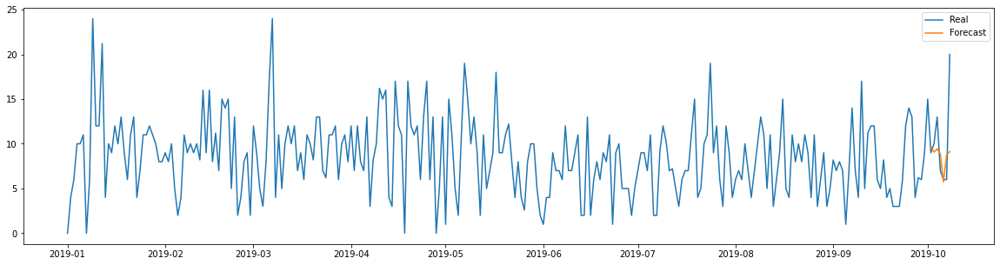

In [49]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N05B'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [50]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

4.529063248534455


## N05C

<AxesSubplot:xlabel='datum'>

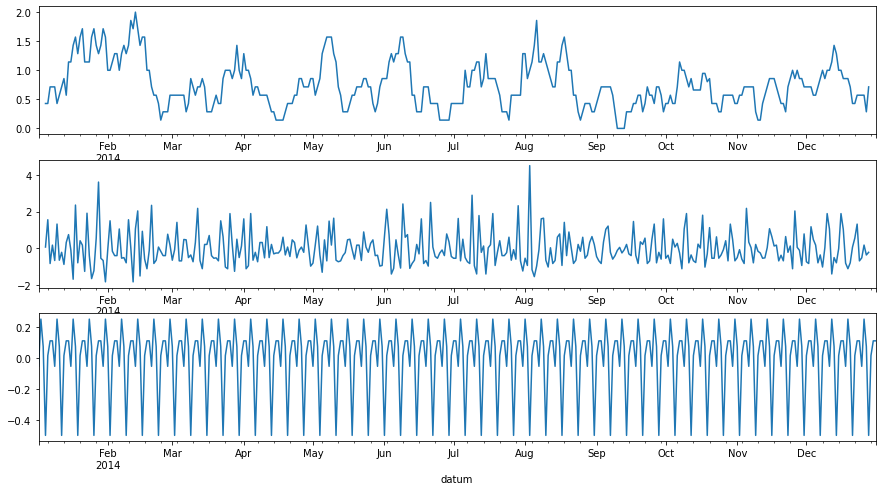

In [95]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N05C"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

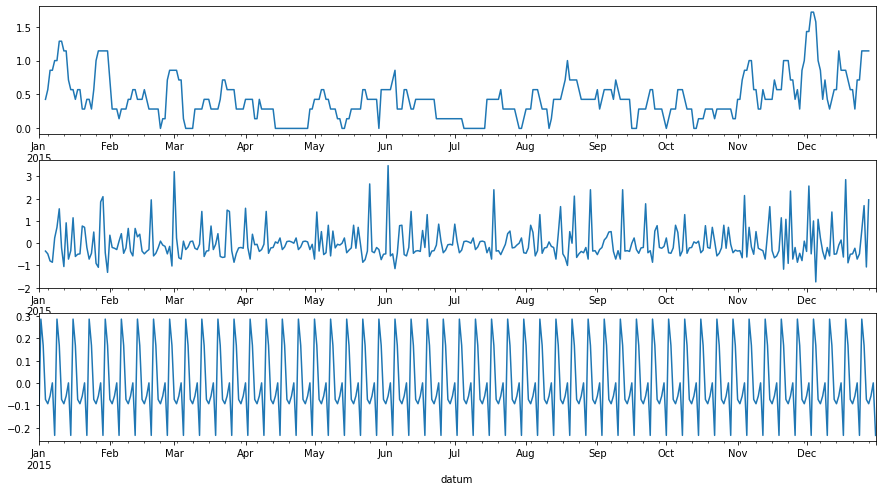

In [96]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N05C"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

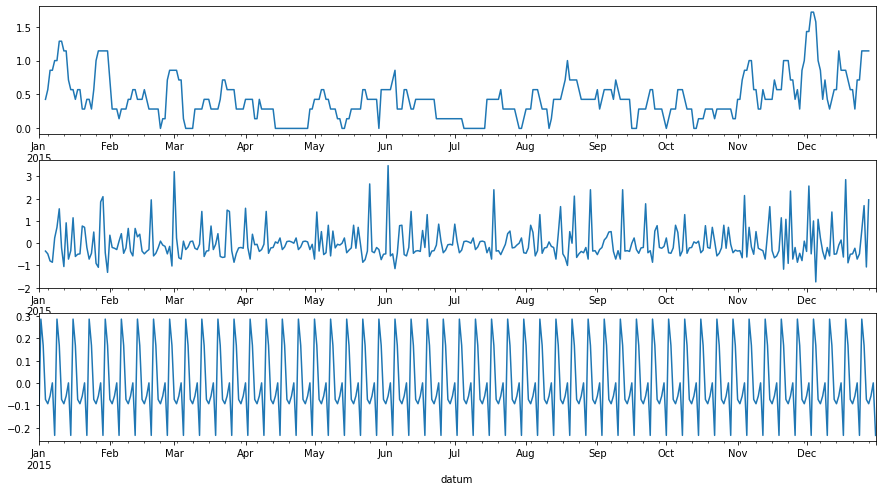

In [97]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["N05C"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [51]:
df = data.loc[:,['N05C']]
train = df[:-7]
test = df[-7:]

In [103]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

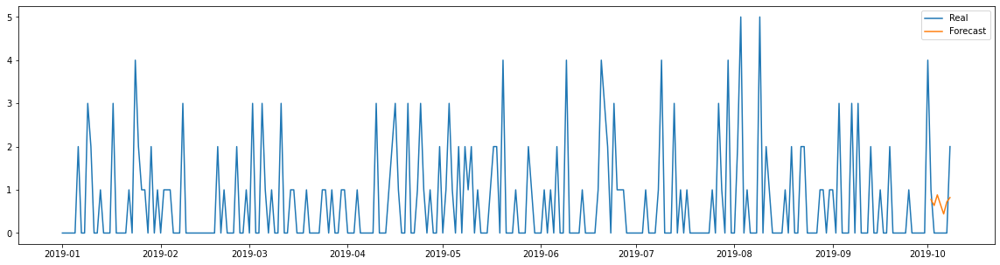

In [104]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N05C'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [105]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.7346022870357327


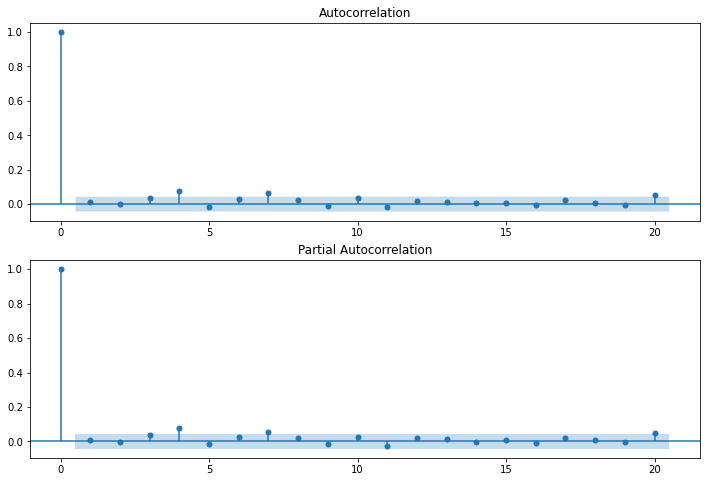

In [56]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["N05C"],lags=20,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["N05C"],lags=20,ax=ax2)

In [52]:
stepwise_fit = auto_arima(data['N05C'],trace = True,suppress_warnings=True,start_p=0,max_p=4,start_q=0,max_q=4,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=6354.081, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=6355.813, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=6355.813, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=6896.535, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=6357.805, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 0.641 seconds


In [53]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(0,0,0))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(0,0,0))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                   N05C   No. Observations:                 2105
Model:                     ARMA(0, 0)   Log Likelihood               -3173.204
Method:                           css   S.D. of innovations              1.093
Date:                Thu, 03 Jun 2021   AIC                           6350.408
Time:                        09:38:03   BIC                           6361.712
Sample:                    01-02-2014   HQIC                          6354.548
                         - 10-07-2019                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5929      0.024     24.896      0.000       0.546       0.640


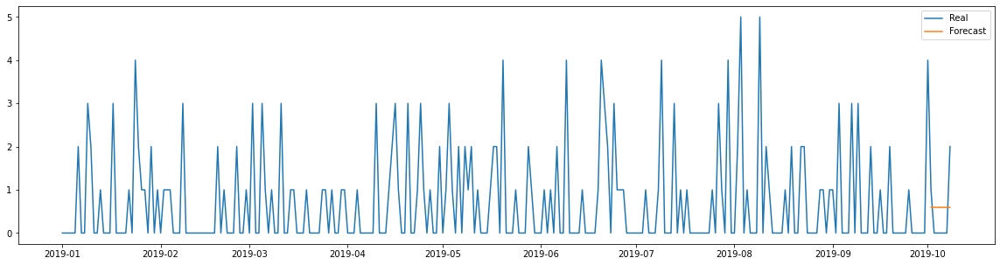

In [54]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N05C'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [55]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.7471124937984381


In [56]:
stepwise_fit = auto_arima(data['N05C'],trace = True,suppress_warnings=True,start_p=0,max_p=4,start_q=0,max_q=4,test='adf',seasonal=True,max_P=4,max_D=1,max_Q=4,m=7)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=6354.081, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=6349.692, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=6349.813, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=6896.535, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=6355.813, Time=0.13 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=6351.663, Time=0.76 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=2.29 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=6349.812, Time=0.32 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=3.57 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=6347.828, Time=0.25 sec
 ARIMA(0,0,0)(2,0,0)[7] intercept   : AIC=6349.796, Time=0.55 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=6347.951, Time=0.21 sec
 ARIMA(0,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=3.01 sec
 ARIMA(0,0,1)(1,0,0)[7] intercept   : AIC=6349.693, T

In [57]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(2,0,2),seasonal_order=(0,0,1,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

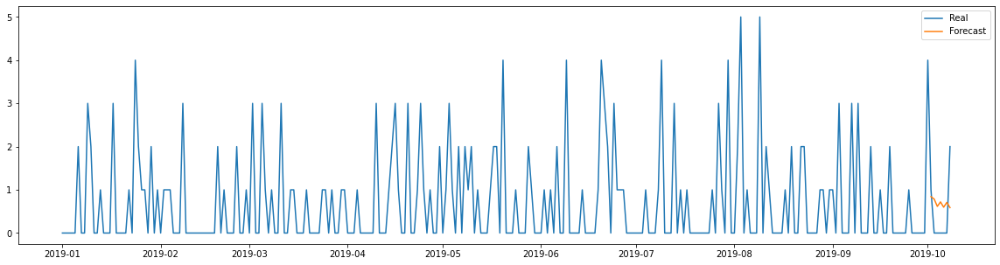

In [58]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['N05C'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [59]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

0.7926873879177639


## R03 

<AxesSubplot:xlabel='datum'>

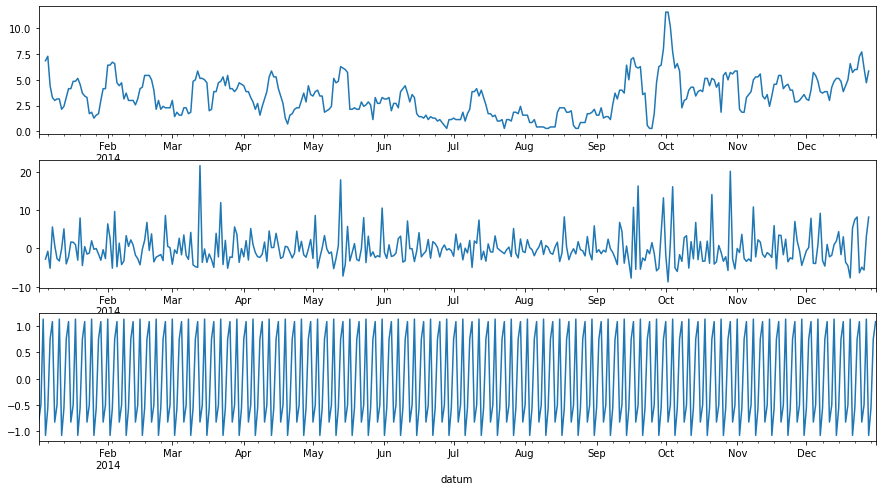

In [106]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["R03"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

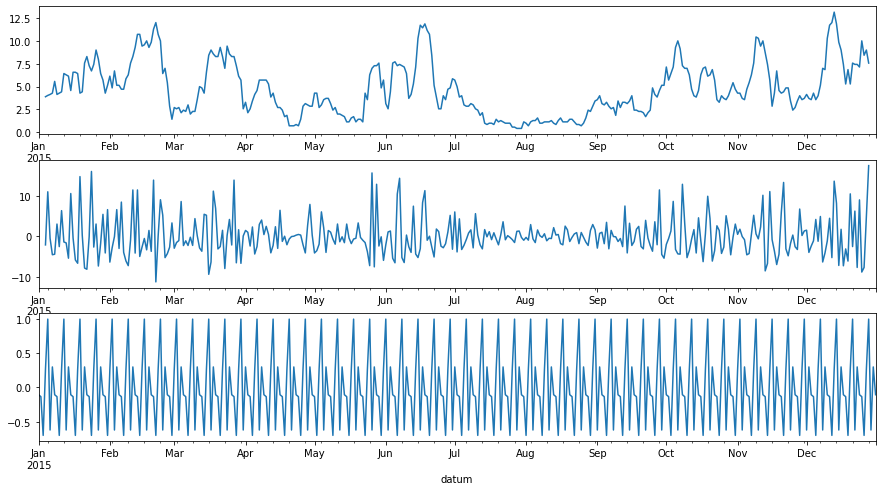

In [107]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["R03"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [65]:
df = data.loc[:,['R03']]
train = df[:-7]
test = df[-7:]

In [116]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

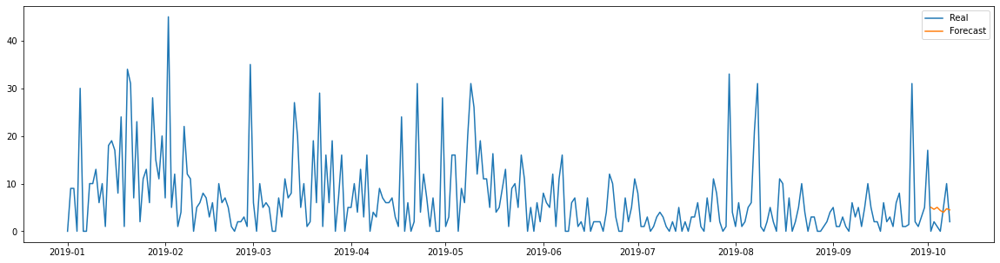

In [117]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['R03'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [119]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

3.8200277309952653


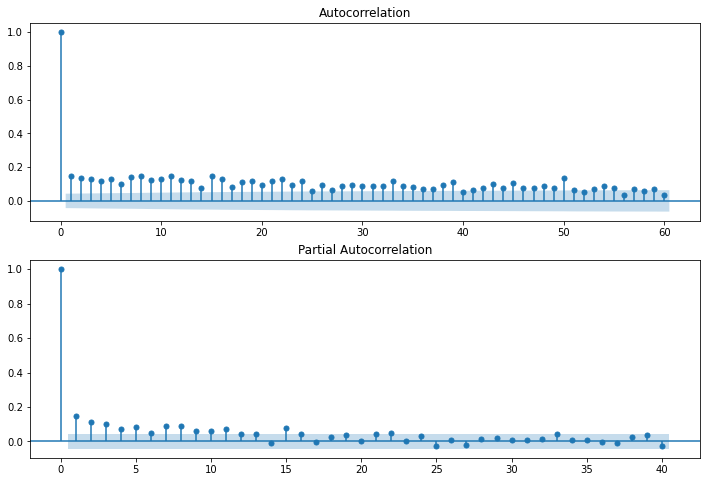

In [65]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["R03"],lags=60,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["R03"],lags=40,ax=ax2)

In [66]:
stepwise_fit = auto_arima(data['R03'],trace = True,suppress_warnings=True,start_p=0,max_p=5,start_q=0,max_q=40,test='adf',d=0)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=13817.166, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=13773.176, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=13781.503, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=14976.260, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=13747.821, Time=0.42 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=13728.476, Time=0.57 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=13718.736, Time=0.64 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=13705.076, Time=0.71 sec
 ARIMA(5,0,1)(0,0,0)[0] intercept   : AIC=13624.076, Time=3.09 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=13623.027, Time=2.52 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=13621.044, Time=2.07 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=13619.058, Time=1.67 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=13617.340, Time=1.12 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=13619.057, Time=2.23 sec
 ARIMA(0,0,2)(0,0,0

In [66]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(1,0,1))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(1,0,1))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                    R03   No. Observations:                 2105
Model:                     ARMA(1, 1)   Log Likelihood               -6801.831
Method:                       css-mle   S.D. of innovations              6.124
Date:                Thu, 03 Jun 2021   AIC                          13611.661
Time:                        10:45:43   BIC                          13634.269
Sample:                    01-02-2014   HQIC                         13619.941
                         - 10-07-2019                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.4693      0.627      8.718      0.000       4.240       6.699
ar.L1.R03      0.9866      0.005    189.357      0.000       0.976       0.997
ma.L1.R03     -0.9353      0.011    -81.626      0.0

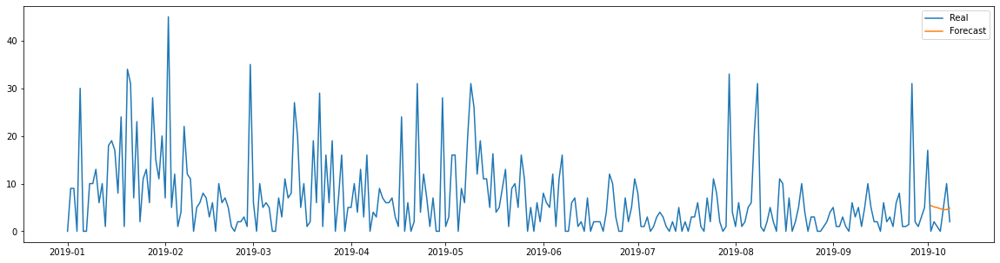

In [67]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['R03'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [68]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

4.053777988305025


In [73]:
stepwise_fit = auto_arima(data['R03'],trace = True,suppress_warnings=True,test='adf',seasonal=True,m=7)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[7] intercept   : AIC=inf, Time=3.98 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=13817.166, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=13748.883, Time=0.72 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=13755.833, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=14976.260, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=13773.176, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=13748.232, Time=1.41 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=13715.917, Time=4.06 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=13714.508, Time=2.05 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=13750.483, Time=0.41 sec
 ARIMA(1,0,0)(1,0,2)[7] intercept   : AIC=13714.967, Time=3.72 sec
 ARIMA(1,0,0)(0,0,2)[7] intercept   : AIC=13750.930, Time=1.60 sec
 ARIMA(1,0,0)(2,0,2)[7] intercept   : AIC=13715.199, Time=4.35 sec
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=13728.288, Time=1.46 sec
 ARIMA(2,0,0)(1,0,1)[7] i

In [74]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(5,0,0),seasonal_order=(1,0,1,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

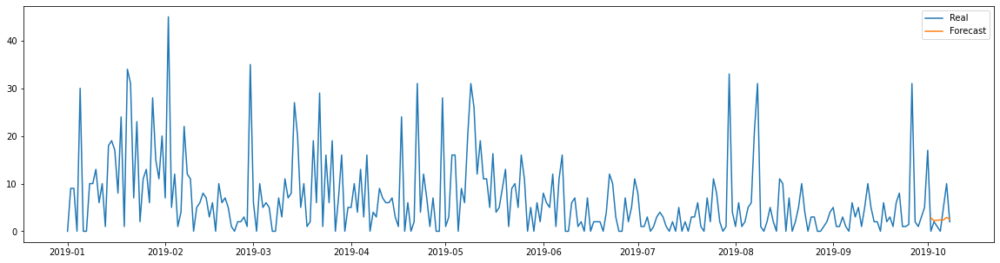

In [75]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['R03'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [76]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

1.7889209981345997


## R06

<AxesSubplot:xlabel='datum'>

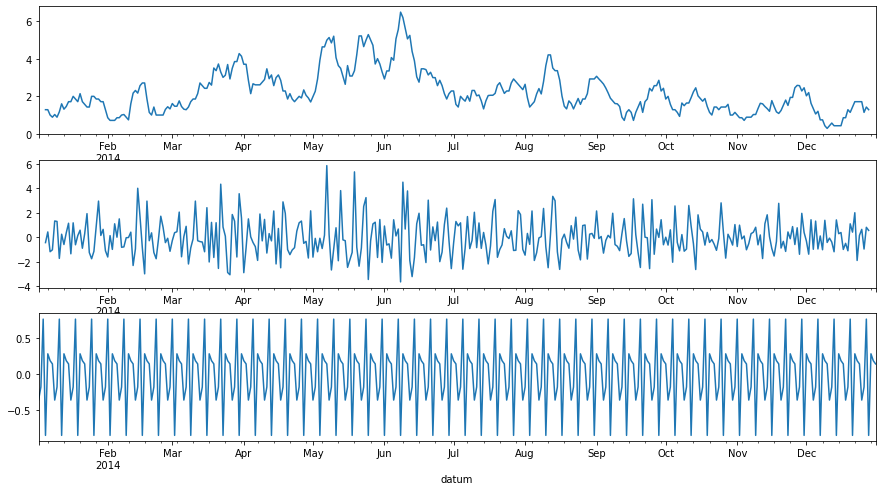

In [126]:
year_mask = data['Year'] == 2014
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["R06"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

<AxesSubplot:xlabel='datum'>

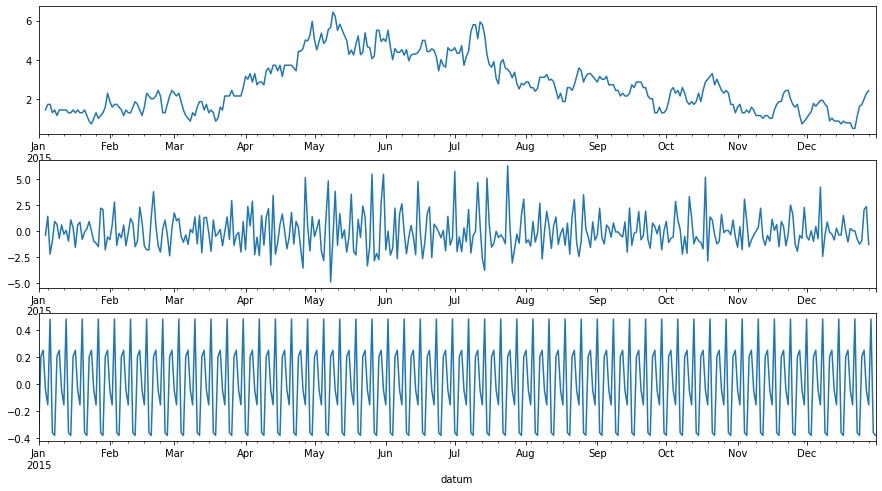

In [127]:
year_mask = data['Year'] == 2015
mask_data = data[year_mask]
res = seasonal_decompose(mask_data["R06"],model='additive')
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(15,8))
res.trend.plot(ax=ax1)
res.resid.plot(ax=ax2)
res.seasonal.plot(ax=ax3)

In [78]:
df = data.loc[:,['R06']]
train = df[:-7]
test = df[-7:]

In [130]:
rolling_predictions = test.copy()
predict = []
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ExponentialSmoothing(train,seasonal_periods=7,seasonal='add').fit()
    
    pred = model.forecast(1)
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

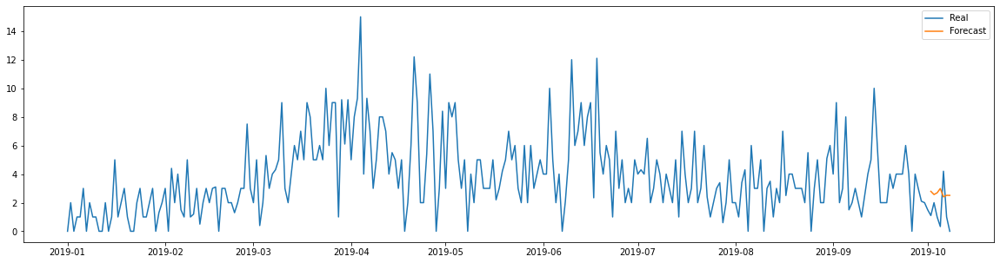

In [132]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['R06'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [133]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

1.8876595084519348


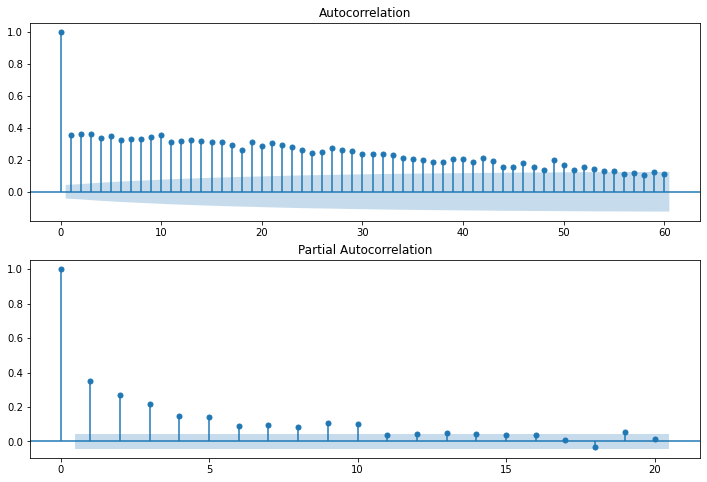

In [72]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["R06"],lags=60,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["R06"],lags=20,ax=ax2)

In [73]:
stepwise_fit = auto_arima(data['R06'],trace = True,suppress_warnings=True,start_p=0,max_p=10,start_q=0,max_q=50,test='adf')

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=9694.709, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=9415.484, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=9512.231, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=11572.893, Time=0.02 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=9260.770, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=9162.522, Time=0.37 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=9119.918, Time=0.30 sec
 ARIMA(5,0,0)(0,0,0)[0] intercept   : AIC=9077.985, Time=0.41 sec
 ARIMA(6,0,0)(0,0,0)[0] intercept   : AIC=9062.640, Time=0.68 sec
 ARIMA(7,0,0)(0,0,0)[0] intercept   : AIC=9045.073, Time=0.81 sec
 ARIMA(8,0,0)(0,0,0)[0] intercept   : AIC=9032.099, Time=1.04 sec
 ARIMA(9,0,0)(0,0,0)[0] intercept   : AIC=9011.142, Time=1.27 sec
 ARIMA(10,0,0)(0,0,0)[0] intercept   : AIC=8991.189, Time=1.34 sec
 ARIMA(10,0,1)(0,0,0)[0] intercept   : AIC=8973.636, Time=4.08 sec
 ARIMA(9,0,1)(0,0,0)[0] interc

In [70]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
model = ARIMA(train,order=(9,0,1))
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = ARIMA(train,order=(9,0,1))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
print(model.summary())
predictions = pd.DataFrame(predict,index=test.index)

                              ARMA Model Results                              
Dep. Variable:                    R06   No. Observations:                 2105
Model:                     ARMA(9, 1)   Log Likelihood               -4471.498
Method:                       css-mle   S.D. of innovations              2.024
Date:                Thu, 03 Jun 2021   AIC                           8966.996
Time:                        10:47:21   BIC                           9034.821
Sample:                    01-02-2014   HQIC                          8991.836
                         - 10-07-2019                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8442      0.363      7.841      0.000       2.133       3.555
ar.L1.R06      0.8983      0.046     19.378      0.000       0.807       0.989
ar.L2.R06      0.0222      0.030      0.752      0.4

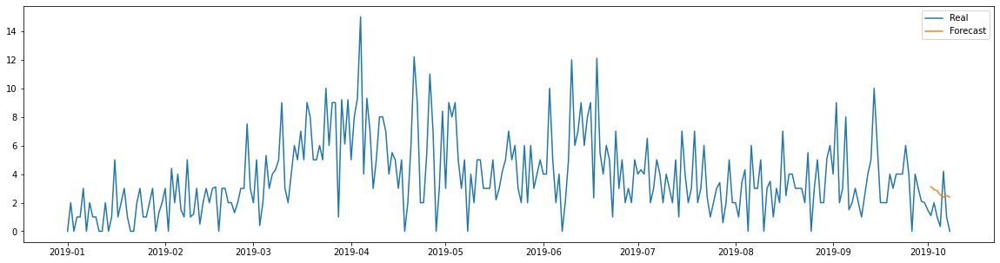

In [71]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['R06'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [72]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

1.867790978688868


In [77]:
stepwise_fit = auto_arima(data['R06'],trace = True,suppress_warnings=True,test='adf',seasonal=True,m=7)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[7] intercept   : AIC=inf, Time=3.89 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=9694.709, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=9344.709, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=9417.937, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=11572.893, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=9415.484, Time=0.12 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=9283.876, Time=1.02 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=9208.067, Time=3.55 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=9209.268, Time=1.86 sec
 ARIMA(1,0,0)(2,0,2)[7] intercept   : AIC=9157.180, Time=4.81 sec
 ARIMA(1,0,0)(1,0,2)[7] intercept   : AIC=9207.687, Time=3.21 sec
 ARIMA(0,0,0)(2,0,2)[7] intercept   : AIC=9209.489, Time=4.51 sec
 ARIMA(2,0,0)(2,0,2)[7] intercept   : AIC=inf, Time=6.43 sec
 ARIMA(1,0,1)(2,0,2)[7] intercept   : AIC=8966.767, Time=6.24 sec
 ARIMA(1,0,1)(1,0,2)[7] intercept   : AIC=

In [79]:
rolling_predictions = test.copy()
predict = []
start = len(train)
end = start + 1
for train_end in test.index:
    
    train = df[:train_end-timedelta(days=1)]
    model = SARIMAX(train,order=(1,0,1),seasonal_order=(2,0,2,7))
    model = model.fit()
    pred = model.predict(start = start,end = end-1,typ='levels')
    start = end
    end = start + 1
    predict.append(pred[0])
    rolling_predictions[train_end] = pred
predictions = pd.DataFrame(predict,index=test.index)

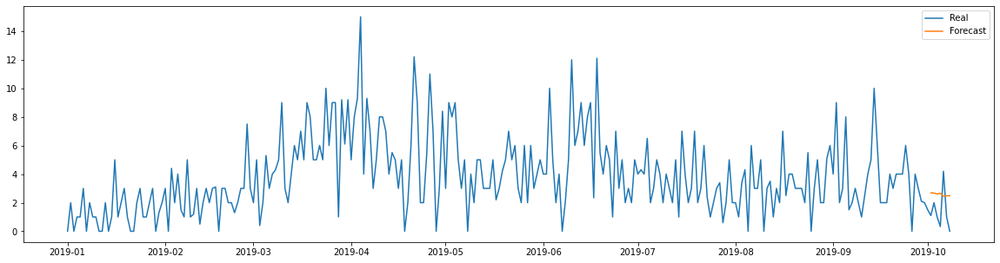

In [80]:
year_mask = data['Year'] == 2019
mask_data = data[year_mask]
fig = plt.figure(figsize=(20,5))
plt.plot(mask_data['R06'],label='Real')
plt.plot(predictions,label='Forecast')
plt.legend()

In [81]:
rmse = math.sqrt(mean_squared_error(test,predictions))
print(rmse)

1.7905122615262217


In [65]:
model = SimpleExpSmoothing(data['M01AB'],initialization_method='estimated').fit(optimized=True)

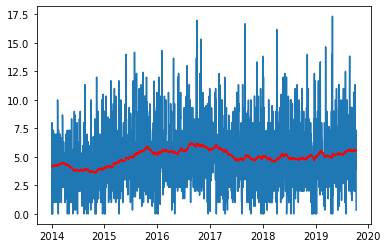

In [66]:
plt.plot(data['M01AB'])
plt.plot(model.fittedvalues,color='red')

In [67]:
model.forecast(7)

2019-10-09    5.500754
2019-10-10    5.500754
2019-10-11    5.500754
2019-10-12    5.500754
2019-10-13    5.500754
2019-10-14    5.500754
2019-10-15    5.500754
Freq: D, dtype: float64

In [70]:
model.fcastvalues

array([5.50075371])

## AutoCorrelation

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

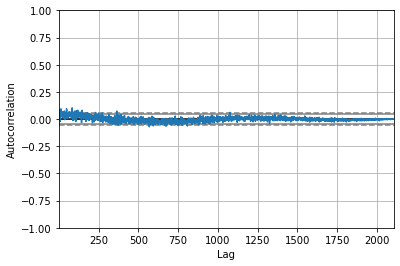

In [68]:
x = data["M01AB"].astype(float)
autocorrelation_plot(x)

<Figure size 3600x3600 with 0 Axes>

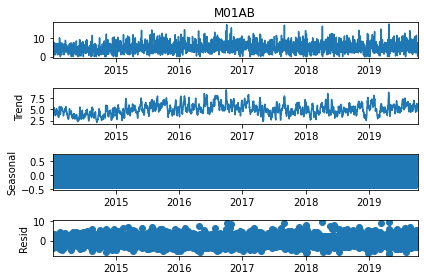

In [69]:
fig = plt.figure(figsize=(50,50))
decompose_result = seasonal_decompose(data["M01AB"],model='additive')
decompose_result.plot();

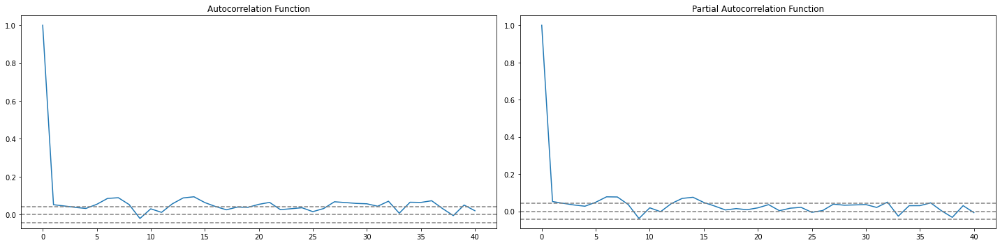

In [31]:
x = data["M01AB"].astype(float)
lag_acf = acf(x, nlags=40, fft=True)
lag_pacf = pacf(x, nlags=40, method='ols')
fig = plt.figure(figsize=(20,5))
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

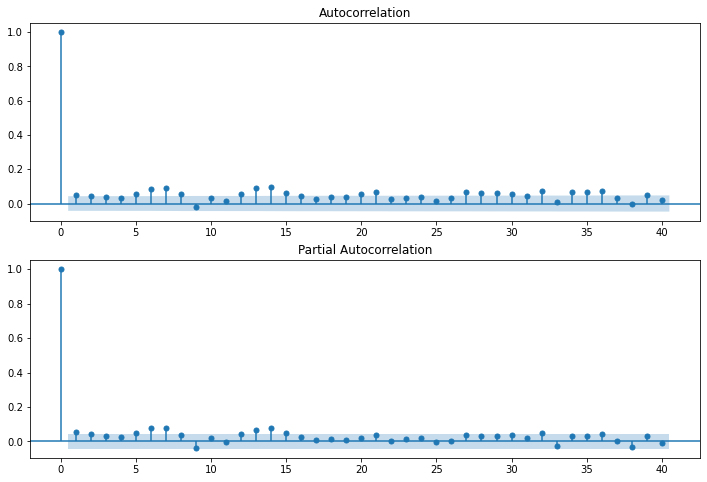

In [22]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["M01AB"],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["M01AB"],lags=40,ax=ax2)

In [157]:
stepwise_fit = auto_arima(data['M01AB'],trace = True,suppress_warnings=True,start_p=0,max_p=6,start_q=0,max_q=6,test='adf',d=None,seasonal=True,max_P=2,max_D=1,max_Q=2,m=7)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=2.54 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=10221.364, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=10204.973, Time=0.62 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=10207.354, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=13331.256, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=10217.606, Time=0.13 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=10192.672, Time=1.27 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=3.19 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,0,0)(2,0,0)[7] intercept   : AIC=10192.624, Time=1.15 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=10206.510, Time=0.49 sec
 ARIMA(0,0,0)(2,0,1)[7] intercept   : AIC=inf, Time=2.84 sec
 ARIMA(0,0,1)(2,0,0)[7] intercept   : AIC=10192.803, Time=1.22 sec
 ARIMA(1,0,1)(2,0,0)[7] intercept   : AIC=10187.512, Time=3.50 sec
 ARIMA(1,0,1)(1,0,0)[7] intercept   : AIC=1

In [81]:
model = ARIMA(train['M01AB'],order=(1,0,1))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  M01AB   No. Observations:                 2099
Model:                     ARMA(1, 1)   Log Likelihood               -5054.094
Method:                       css-mle   S.D. of innovations              2.688
Date:                Sun, 16 May 2021   AIC                          10116.188
Time:                        17:28:16   BIC                          10138.785
Sample:                    01-02-2014   HQIC                         10124.465
                         - 10-01-2019                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           5.0125      0.328     15.298      0.000       4.370       5.655
ar.L1.M01AB     0.9972      0.002    473.629      0.000       0.993       1.001
ma.L1.M01AB    -0.9826      0.005   -198.820      0.000      -0.992      -0.973
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0028           +0.0000j            1.0028            0.0000
MA.1            1.0178           +0.0000j            1.0178            0.0000
-----------------------------------------------------------------------------
"""

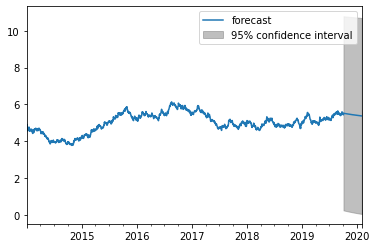

<Figure size 5040x2880 with 0 Axes>

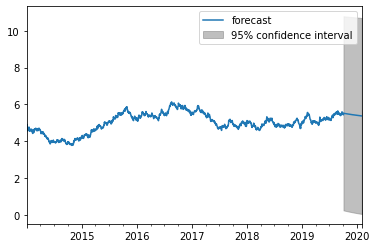

In [73]:
fig = plt.figure(figsize=(70,40))
model.plot_predict(1,2220,plot_insample=False)

In [82]:
model.forecast(steps=7)[0]

array([5.52017384, 5.51877487, 5.51737975, 5.51598848, 5.51460104,
       5.51321743, 5.51183762])

In [84]:
np.array(test)

array([[5.18],
       [5.  ],
       [7.34],
       [3.84],
       [4.  ],
       [7.34],
       [0.33]])

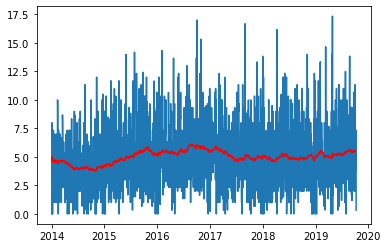

In [56]:
plt.plot(data['M01AB'])
plt.plot(model.fittedvalues,color='red')

In [76]:
model.params

const          5.012474
ar.L1.M01AB    0.997244
ma.L1.M01AB   -0.982555
dtype: float64

In [47]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse=sqrt(mean_squared_error(pred,test['M01AB']))
print(rmse)

2.277026238687789


## M01AE 

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

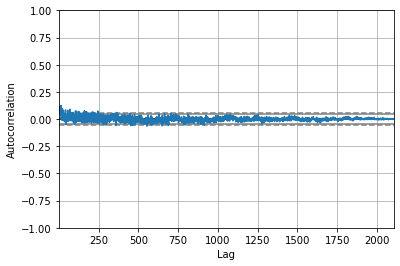

In [87]:
x = data["M01AE"].astype(float)
autocorrelation_plot(x)

<Figure size 3600x3600 with 0 Axes>

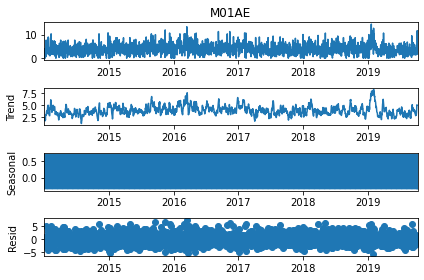

In [89]:
fig = plt.figure(figsize=(50,50))
decompose_result = seasonal_decompose(data["M01AE"],model='additive')
decompose_result.plot();

In [88]:
df = data.loc[:,['M01AE']]
train = df[:-7]
test = df[-7:]

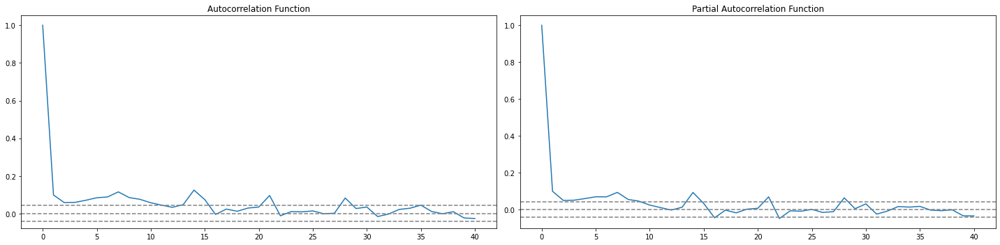

In [57]:
x = data["M01AE"].astype(float)
lag_acf = acf(x, nlags=40, fft=True)
lag_pacf = pacf(x, nlags=40, method='ols')
fig = plt.figure(figsize=(20,5))
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(x)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

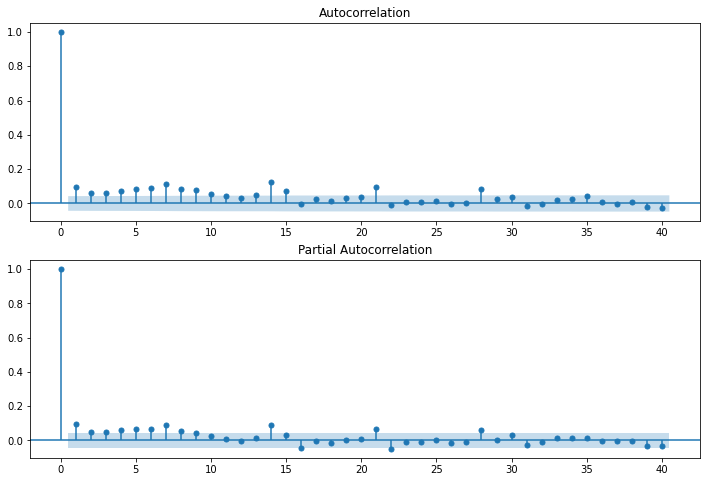

In [86]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(data["M01AE"],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(data["M01AE"],lags=40,ax=ax2)

In [60]:
stepwise_fit = auto_arima(df['M01AE'],trace = True,suppress_warnings=True,start_p=1,max_p=30,start_q=1,max_q=30,test='adf',d=None,seasonal=False)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=9125.872, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=12258.578, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=10182.019, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=11262.200, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=9125.584, Time=0.61 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=9782.334, Time=0.10 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=9127.485, Time=0.63 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=9128.258, Time=0.78 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=9125.553, Time=0.56 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=10801.198, Time=0.16 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=9127.495, Time=0.83 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=10530.617, Time=0.21 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=9129.002, Time=1.07 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=9098.588, Time=1.80 sec
 ARIMA(0,0,2)(0,0,0)[0] inte

In [8]:
model = ARIMA(train['M01AE'],order=(1,0,1))
model = model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  M01AE   No. Observations:                 2099
Model:                     ARMA(1, 1)   Log Likelihood               -4524.014
Method:                       css-mle   S.D. of innovations              2.088
Date:                Sat, 15 May 2021   AIC                           9056.028
Time:                        18:28:38   BIC                           9078.624
Sample:                    01-02-2014   HQIC                          9064.304
                         - 10-01-2019                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           3.8822      0.104     37.379      0.000       3.679       4.086
ar.L1.M01AE     0.9542      0.015     65.281      0.000       0.926       0.983
ma.L1.M01AE    -0.8952      0.021    -42.031      0.000      -0.937      -0.853
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0480           +0.0000j            1.0480            0.0000
MA.1            1.1171           +0.0000j            1.1171            0.0000
-----------------------------------------------------------------------------
"""

In [10]:
start = len(train)
end = len(train)+len(test)-1
print(start , end)
pred = model.predict(start=start,end=end,typ = 'levels')
print(pred)

2099 2105
2019-10-02    3.508715
2019-10-03    3.525804
2019-10-04    3.542111
2019-10-05    3.557672
2019-10-06    3.572521
2019-10-07    3.586691
2019-10-08    3.600212
Freq: D, dtype: float64


In [84]:
from sklearn.metrics import mean_squared_error
from math import sqrt
mean = data['M01AE'].mean()
rmse=sqrt(mean_squared_error(pred,test['M01AE']))
print(rmse)
print(mean)

3.1892558673478058
3.895830316160029


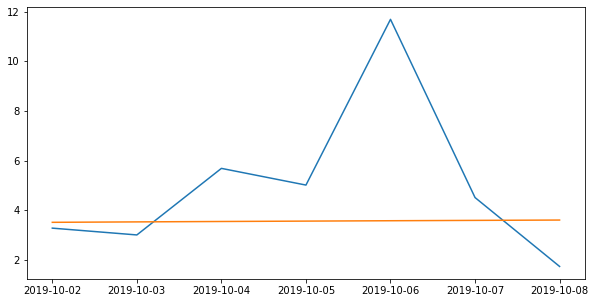

In [66]:
fig = plt.figure(figsize=(10,5))
plt.plot(test,label='Real')
plt.plot(pred,label='Forecast')